# Gradient Boosting Regressor

In [1]:
# define load_data
def load_data(tags, start = 'NA', end = 'NA'):
    
    chw = [string for string in tags if string.endswith("ChilledWater_Demand_kBtu")]
    steam = [string for string in tags if string.endswith("Steam_Demand_kBtu")]
    elec = [string for string in tags if string.endswith("Electricity_Demand_kBtu")]
    
    if (start == 'NA') | (end == 'NA'):
        if elec:
            elec_tags = pd.read_csv('elec_tags.csv')
            start = elec_tags[elec_tags['Electricity_Demand_kBtu'] == tags[0]]['start'].tolist()[0]
            end = elec_tags[elec_tags['Electricity_Demand_kBtu'] == tags[0]]['end'].tolist()[0]

        if chw:
            chw_tags = pd.read_csv('chw_tags.csv')
            start = chw_tags[chw_tags['ChilledWater_Demand_kBtu'] == tags[0]]['start'].tolist()[0]
            end = chw_tags[chw_tags['ChilledWater_Demand_kBtu'] == tags[0]]['end'].tolist()[0]

        if steam:
            steam_tags = pd.read_csv('steam_tags.csv')
            start = steam_tags[steam_tags['Steam_Demand_kBtu'] == tags[0]]['start'].tolist()[0]
            end = steam_tags[steam_tags['Steam_Demand_kBtu'] == tags[0]]['end'].tolist()[0]
            
    calc = 'summary' 
    interval = '1h'  
    chunk_size = 10
    weight = 'TimeWeighted'
    summary_calc = 'average' 
    max_count = round(1500000/len(tags))

    df = pi.get_stream_by_point(tags, start=start, end=end, _convert_cols=False, calculation=calc, 
                                interval=interval, _weight=weight, _summary_type=summary_calc, _max_count=max_count, 
                                _chunk_size=chunk_size)
    return df


## EDA

In [2]:
# define plot_demand
def plot_demand(tags, title = 'Utility Demand kBtu'):
    
    import matplotlib as mpl
    mpl.style.use('seaborn-whitegrid')
    
    tag = [string for string in tags if string.endswith("_Demand_kBtu")]
        
    plt.figure(figsize = (12,8))
    plt.plot(df[tag], color = '#F18F01', linewidth = 0.5, alpha = 0.7)
    plt.title(title, fontsize = 16)
    plt.xlabel('Dates', fontsize = 12)
    plt.ylabel('Demand kBtu', fontsize = 12)


## Prep data

In [3]:
# prep dataframe
# Account for the case of each utility
def prep_df(df):
    chw = [string for string in df.columns if string.endswith("ChilledWater_Demand_kBtu")]
    steam = [string for string in df.columns if string.endswith("Steam_Demand_kBtu")]
    elec = [string for string in df.columns if string.endswith("Electricity_Demand_kBtu")]
    
    #add outside temp
    tag = pi.search_by_point(['aiTIT4045'])
    start = df.index[0]
    end = df.index[-1]
    calc = 'summary' 
    interval = '1h'   
    chunk_size = 10
    weight = 'TimeWeighted'
    summary_calc = 'average' 
    max_count = round(1500000/len(tag))

    temp = pi.get_stream_by_point(tag, start=start, end=end, _convert_cols=False, calculation=calc, 
                                interval=interval, _weight=weight, _summary_type=summary_calc, _max_count=max_count, 
                                _chunk_size=chunk_size)

    df['aiTIT4045'] = temp.aiTIT4045
    
    #add Holidays
    tag = pi.search_by_point(['ACE_Holidays_Boolean'])
    start = df.index[0]
    end = df.index[-1]
    calc = 'summary' 
    interval = '1h'   
    chunk_size = 10
    weight = 'TimeWeighted'
    summary_calc = 'average' 
    max_count = round(1500000/len(tag))

    hol = pi.get_stream_by_point(tag, start=start, end=end, _convert_cols=False, calculation=calc, 
                                interval=interval, _weight=weight, _summary_type=summary_calc, _max_count=max_count, 
                                _chunk_size=chunk_size)

    df['Holiday'] = hol.ACE_Holidays_Boolean
    
    #add hour
    df.reset_index(inplace=True)
    df['Hour'] = pd.to_datetime(df['Timestamp']).apply(lambda x: '{hour}'.format(hour = x.hour))
    df['Hour'] = df['Hour'].astype('int64') 
    
    
    if chw:
        #add HDH
        df['HDH'] = 65 - df['aiTIT4045']
        df.loc[df['HDH'] < 0, 'HDH'] = 0

        #add CDH
        df['CDH'] = (df['aiTIT4045'] - 65)**2
        df.loc[df['CDH'] < 0, 'CDH'] = 0
        
        #add month
        df['Month'] = pd.to_datetime(df['Timestamp']).apply(lambda x: '{month}'.format(month = x.month))
        df['Month'] = df['Month'].astype('int64')
                                       
    if steam:
        #add HDH
        df['HDH'] = (65 - df['aiTIT4045'])**2
        df.loc[df['HDH'] < 0, 'HDH'] = 0
        
        #add CDH
        df['CDH'] = df['aiTIT4045'] - 65
        df.loc[df['CDH'] < 0, 'CDH'] = 0
        
        #add day of the week
        df['DayOfWeek'] = df['Timestamp'].dt.strftime('%w')
        df['DayOfWeek'] = df['DayOfWeek'].astype('int64')
        df['Weekend'] = 0
        df.loc[(df['DayOfWeek'] == 0) | (df['DayOfWeek'] == 6), 'Weekend'] = 1
        df.loc[(df['DayOfWeek'] == 1) | (df['DayOfWeek'] == 2) | (df['DayOfWeek'] == 3) | (df['DayOfWeek'] == 4) | (df['DayOfWeek'] == 5), 'Weekend'] = 0
        df.drop(['DayOfWeek'], inplace = True, axis = 1)
                                       
        #add month
        #df.reset_index(inplace=True)
        df['Month'] = pd.to_datetime(df['Timestamp']).apply(lambda x: '{month}'.format(month = x.month)) 
        df['Month'] = df['Month'].astype('int64')                                
                                       
    if elec:
        #add HDH
        df['HDH'] = 65 - df['aiTIT4045']
        df.loc[df['HDH'] < 0, 'HDH'] = 0
        
        #add CDH
        df['CDH'] = df['aiTIT4045'] - 65
        df.loc[df['CDH'] < 0, 'CDH'] = 0
        
        #if the status is complete add wifi to df
        elec_tags = pd.read_csv('elec_tags.csv')
        row = elec_tags.loc[elec_tags['Electricity_Demand_kBtu'] == elec[0]]
        status = row.Status.tolist()
        
        if status == 'complete':
            # add WiFi
            wifi_matched_tags = pd.read_csv('wifi_matched_tags.csv')

            wifi_tag = wifi_matched_tags[wifi_matched_tags['Electricity_Tag'] == elec[0]]['Wi-Fi Tags'].to_list()

            df.set_index('Timestamp',inplace=True)
            start = df.index[0]
            end = df.index[-1]
            calc = 'summary' 
            interval = '1h'   
            chunk_size = 10
            weight = 'TimeWeighted'
            summary_calc = 'average' 
            max_count = round(1500000/len(wifi_tag))

            wifi = pi.get_stream_by_point(wifi_tag, start=start, end=end, _convert_cols=False, calculation=calc, 
                                        interval=interval, _weight=weight, _summary_type=summary_calc, _max_count=max_count, 
                                        _chunk_size=chunk_size)

            if len(wifi_tag) > 1:
                col = np.zeros(len(wifi))
                for i in wifi_tag:
                    col = wifi[i] + col
                df['Wifi_Occupancy_Count'] = col
            else:
                df['Wifi_Occupancy_Count'] = wifi[[wifi_tag[0]]]
            
            df.reset_index(inplace = True)
        
    return df                              
                                       
        

## Cleaning data

In [4]:
# cleaning data function
# add contition to check for quality of data. Too many missing values or zeros? If so return something to prompt main function to switch years
def clean_data(df):
    demand = [string for string in df.columns if string.endswith("_Demand_kBtu")]
    df = df[df[demand[0]] > 0]
    df = df[(df['aiTIT4045'] > 0) & (df['aiTIT4045'] < 120)]
    steam = [string for string in df.columns if string.endswith("Steam_Demand_kBtu")]
    elec = [string for string in df.columns if string.endswith("Electricity_Demand_kBtu")]

    if steam: 
        df = df[df[steam[0]] < 6500]

    df.dropna(axis=0, inplace=True)
    df.set_index('Timestamp',inplace = True)

    if elec:
        elec_tags = pd.read_csv('elec_tags.csv')
        row = elec_tags.loc[elec_tags['Electricity_Demand_kBtu'] == elec[0]]
        status = row.Status.tolist()
        
        if status == 'complete':
            wifi = [string for string in df.columns if string.endswith("_Count")]
            df_out = df[[demand[0], 'aiTIT4045', wifi[0]]].copy()
        else:
            df_out = df[[demand[0], 'aiTIT4045']].copy()

    else:
        df_out = df[[demand[0], 'aiTIT4045']].copy()

    IQR = df_out.quantile(0.75) - df_out.quantile(0.25)
    df_final = df_out[~((df_out < (df_out.quantile(0.25) - 3 * IQR)) | (df_out > (df_out.quantile(0.75) + 3 * IQR)))]

    df_final.dropna(axis=0, inplace=True)

    df_final.reset_index(inplace=True)
    df = df.loc[df_final['Timestamp']]
    df.reset_index(inplace = True)

    df.drop(['aiTIT4045'], inplace=True, axis=1)
        
    return df 
      

## Split

In [5]:
# define split function
def split_data(df):
    from sklearn.model_selection import train_test_split 
    demand = [string for string in df.columns if string.endswith("_Demand_kBtu")]
    
    x = df.drop(demand, axis = 1)
    y = df[demand].values.reshape(-1,1)

    X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.1, shuffle = False)
    X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size = 0.5, shuffle = False)
    
    dates_train = X_train['Timestamp']
    dates_test = X_test['Timestamp']
    dates_val = X_val['Timestamp']
    X_train.drop('Timestamp', axis = 1, inplace = True)
    X_test.drop('Timestamp', axis = 1, inplace = True)
    X_val.drop('Timestamp', axis = 1, inplace = True)
    
    return X_train, X_test, X_val, y_train, y_test, y_val, dates_train, dates_test, dates_val    
    

## Model

In [6]:
#define model building function
def get_predictions(X_train = 'NA', X_test = 'NA', X_val = 'NA', y_train = 'NA', y_test = 'NA', y_val = 'NA', test = False, last_month_x = 'NA', last_month_y = 'NA'):
    from sklearn.ensemble import GradientBoostingRegressor
    from sklearn.model_selection import RandomizedSearchCV
    
    param_grid = {'criterion':['friedman_mse', 'mse'], 'loss':['ls','lad'],'learning_rate':[0.1,0.01, 0.001, 0.05],                               
                  'n_estimators':np.linspace(10, 200).astype(int), 'random_state':[1], 'min_samples_split': [2, 5, 10],
                 'max_depth': [None] + list(np.linspace(3, 20).astype(int)), 'max_leaf_nodes': [None] + list(np.linspace(10, 50, 500).astype(int))}

    estimator = GradientBoostingRegressor()

    rs = RandomizedSearchCV(estimator, param_grid, n_jobs = -1, 
                            scoring = 'neg_root_mean_squared_error', cv = 5, 
                            n_iter = 10, verbose = 1)
    rs.fit(X_train, y_train)
    
    parameters = rs.best_params_
    
    model = GradientBoostingRegressor(**parameters)
    model.fit(X_train, y_train)
    
    from sklearn import metrics
    from statistics import mean
    
    if test == True:
        pred_month = model.predict(last_month_x)
        mse_month = metrics.mean_squared_error(last_month_y, pred_month)
        rmse_month = np.sqrt(metrics.mean_squared_error(last_month_y, pred_month))
        mae_month = metrics.mean_absolute_error(last_month_y, pred_month)
        cv_rmse_month = rmse_month / mean(last_month_y.flatten())
        r2_month = metrics.r2_score(last_month_y, pred_month)
        
        results = pd.DataFrame(np.array([['MSE', mse_month], ['RMSE', rmse_month], ['MAE', mae_month], ['CV(RMSE)', cv_rmse_month], ['R-squared', r2_month]]), columns=['Measure', 'Last_Month'])

        return pred_month, results
        
    else:
        
        pred_train = model.predict(X_train)
        pred_test = model.predict(X_test)
        pred_val = model.predict(X_val)

        #train
        mse_train = metrics.mean_squared_error(y_train, pred_train)
        rmse_train = np.sqrt(metrics.mean_squared_error(y_train, pred_train))
        mae_train = metrics.mean_absolute_error(y_train, pred_train)
        cv_rmse_train = rmse_train / mean(y_train.flatten())
        r2_train = metrics.r2_score(y_train, pred_train)

        #test
        mse_test = metrics.mean_squared_error(y_test, pred_test)
        rmse_test = np.sqrt(metrics.mean_squared_error(y_test, pred_test))
        mae_test = metrics.mean_absolute_error(y_test, pred_test)
        cv_rmse_test = rmse_test / mean(y_test.flatten())
        r2_test = metrics.r2_score(y_test, pred_test)

        #val
        mse_val = metrics.mean_squared_error(y_val, pred_val)
        rmse_val = np.sqrt(metrics.mean_squared_error(y_val, pred_val))
        mae_val = metrics.mean_absolute_error(y_val, pred_val)
        cv_rmse_val = rmse_val / mean(y_val.flatten())
        r2_val = metrics.r2_score(y_val, pred_val)

        results = pd.DataFrame(np.array([['MSE', mse_train, mse_test, mse_val], ['RMSE', rmse_train, rmse_test, rmse_val], ['MAE', mae_train, mae_test, mae_val], ['CV(RMSE)', cv_rmse_train, cv_rmse_test, cv_rmse_val], ['R-squared', r2_train, r2_test, r2_val]]), columns=['Measure', 'Train', 'Test', 'Val'])

        return pred_train, pred_test, pred_val, results


## Show results

In [7]:
# visualize predictions
def show_predictions(y_train = 'NA', y_test = 'NA', y_val = 'NA', pred_train = 'NA', pred_test = 'NA', pred_val = 'NA', dates_train = 'NA', dates_test = 'NA', dates_val = 'NA', test = False, last_month_y = 'NA', pred_month = 'NA', dates_month = 'NA', tag = ''):
    
    from sklearn import metrics
    from statistics import mean
    
    import matplotlib as mpl
    mpl.style.use('seaborn-whitegrid')
    
    if test == True:
        
        #month
        mse_month = metrics.mean_squared_error(last_month_y, pred_month)
        rmse_month = np.sqrt(metrics.mean_squared_error(last_month_y, pred_month))
        mae_month = metrics.mean_absolute_error(last_month_y, pred_month)
        cv_rmse_month = rmse_month / mean(last_month_y.flatten())
        r2_month = metrics.r2_score(last_month_y, pred_month)
        

        plt.figure(figsize = (12, 8))
        plt.plot(dates_month, last_month_y, color='#F18F01', linewidth=0.5, alpha = 0.7)
        plt.plot(dates_month, pred_month, color='#006E90', linewidth=0.5, alpha = 0.9)

        plt.title(f'GradientBoostingRegressor: Predicted vs True Values \n Last Month of {tag} Data \n MSE: {round(mse_month, 4)}     MAE: {round(mae_month,4)}    RMSE: {round(rmse_month, 4)}  \n CV(RMSE): {round(cv_rmse_month, 4)}     R2:{round(r2_month,4)}', fontsize = 16)
        plt.xlabel('Dates', fontsize = 12)
        plt.ylabel('Demand kBtu', fontsize = 12)

        leg = plt.legend(labels = ['True','Predicted'], loc = "upper right", bbox_to_anchor=(1.2, 1), fontsize = 12)

        for line in leg.get_lines():
            line.set_linewidth(5.0)
    
    else:
    
        #train
        mse_train = metrics.mean_squared_error(y_train, pred_train)
        rmse_train = np.sqrt(metrics.mean_squared_error(y_train, pred_train))
        mae_train = metrics.mean_absolute_error(y_train, pred_train)
        cv_rmse_train = rmse_train / mean(y_train.flatten())
        r2_train = metrics.r2_score(y_train, pred_train)

        #test
        mse_test = metrics.mean_squared_error(y_test, pred_test)
        rmse_test = np.sqrt(metrics.mean_squared_error(y_test, pred_test))
        mae_test = metrics.mean_absolute_error(y_test, pred_test)
        cv_rmse_test = rmse_test / mean(y_test.flatten())
        r2_test = metrics.r2_score(y_test, pred_test)

        #val
        mse_val = metrics.mean_squared_error(y_val, pred_val)
        rmse_val = np.sqrt(metrics.mean_squared_error(y_val, pred_val))
        mae_val = metrics.mean_absolute_error(y_val, pred_val)
        cv_rmse_val = rmse_val / mean(y_val.flatten())
        r2_val = metrics.r2_score(y_val, pred_val)


        plt.figure(figsize = (12, 30))

        plt.subplot(3,1,1)
        plt.plot(dates_train, y_train, color='#F18F01', linewidth=0.5, alpha = 0.7)
        plt.plot(dates_train, pred_train, color='#006E90', linewidth=0.5, alpha = 0.9)

        plt.title(f'GradientBoostingRegressor: Predicted vs True Values \n Training Data \n MSE: {round(mse_train, 4)}     MAE: {round(mae_train,4)}    RMSE: {round(rmse_train, 4)}  \n CV(RMSE): {round(cv_rmse_train, 4)}     R2:{round(r2_train,4)}', fontsize = 16)
        plt.xlabel('Dates', fontsize = 12)
        plt.ylabel('Demand kBtu', fontsize = 12)

        leg = plt.legend(labels = ['True','Predicted'], loc = "upper right", bbox_to_anchor=(1.2, 1), fontsize = 12)

        for line in leg.get_lines():
            line.set_linewidth(5.0)

        plt.subplot(3,1,2)
        plt.plot(dates_test, y_test, color='#F18F01', linewidth=0.5, alpha = 0.7)
        plt.plot(dates_test, pred_test, color='#006E90', linewidth=0.5, alpha = 0.9)

        plt.title(f'Testing Data \n MSE: {round(mse_test, 4)}     MAE: {round(mae_test,4)}    RMSE: {round(rmse_test, 4)} \n CV(RMSE): {round(cv_rmse_test, 4)}    R2:{round(r2_test,4)}', fontsize = 16)
        plt.xlabel('Dates', fontsize = 12)
        plt.ylabel('Demand kBtu', fontsize = 12)

        leg = plt.legend(labels = ['True','Predicted'], loc = "upper right", bbox_to_anchor=(1.2, 1), fontsize = 12)

        for line in leg.get_lines():
            line.set_linewidth(5.0)

        plt.subplot(3,1,3)
        plt.plot(dates_val, y_val, color='#F18F01', linewidth=0.5, alpha = 0.7)
        plt.plot(dates_val, pred_val, color='#006E90', linewidth=0.5, alpha = 0.9)

        plt.title(f'Validation Data \n MSE: {round(mse_val, 4)}     MAE: {round(mae_val,4)}     RMSE: {round(rmse_val, 4)} \n CV(RMSE): {round(cv_rmse_val, 4)}     R2:{round(r2_val,4)}', fontsize = 16)
        plt.xlabel('Dates', fontsize = 12)
        plt.ylabel('Demand kBtu', fontsize = 12)


        leg = plt.legend(labels = ['True','Predicted'], loc = "upper right", bbox_to_anchor=(1.2, 1), fontsize = 12)

        for line in leg.get_lines():
            line.set_linewidth(5.0)



# Implementation

In [8]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ecotools.pi_client import pi_client

sns.set('paper')
# Option Paramater time_zone
# default timezone is time_zone='America/Los_Angeles' use https://www.iana.org/time-zones 

#pi = pi_client(username= r'ad3\username')
pi = pi_client(username = r'ad3\dlrueda')

ad3\dlrueda, please provide your password (text will be hidden) 
>>········
save password? [y/n] /n after saving, set username = 'file' to use this feature 
>>n


# Putting it together

In [13]:
def demandkBtu_model(tags, test = False, start = 'NA', end = 'NA'):
    elec_tags = pd.read_csv('elec_tags.csv')
    chw_tags = pd.read_csv('chw_tags.csv')
    steam_tags = pd.read_csv('steam_tags.csv')
    elec_tags = elec_tags[elec_tags['Status'] != 'no data']
    chw_tags = chw_tags[chw_tags['Status'] != 'no data']
    steam_tags = steam_tags[steam_tags['Status'] != 'no data']
    possible_tags = elec_tags['Electricity_Demand_kBtu'].tolist() + chw_tags['ChilledWater_Demand_kBtu'].tolist() + steam_tags['Steam_Demand_kBtu'].tolist()
    
    if tags[0] not in possible_tags:
        return print(tags[0], 'contains unreliable data or no data at all')
    
    if (chw_tags.loc[chw_tags['ChilledWater_Demand_kBtu'] == tags[0]]['Status'].tolist() == 'bad model') | (elec_tags.loc[elec_tags['Electricity_Demand_kBtu'] == tags[0]]['Status'].tolist() == 'bad model') | (steam_tags.loc[steam_tags['Steam_Demand_kBtu'] == tags[0]]['Status'].tolist() == 'bad model'):  
        return print(tags[0], 'produces an unreliable model with CV(RMSE) over 0.35 or R-squared under 0.75')
    
    df = clean_data(prep_df(load_data(tags, start, end)))
    
    if test == True:
        last = len(df) - 1
        first = last - 730 
        last_month = df.iloc[np.r_[first:last]]

        last_month_x = last_month.drop(tags[0], axis = 1)
        last_month_y = last_month[tags[0]].values.reshape(-1,1)
        dates_month = last_month['Timestamp']
        dates_month.reset_index(inplace = True, drop = True)
        last_month_x.drop('Timestamp', axis = 1, inplace = True)
        
        X_train, X_test, X_val, y_train, y_test, y_val, dates_train, dates_test, dates_val = split_data(df)
        
        pred_month, results = get_predictions(X_train = X_train, y_train = y_train, test = True, last_month_y = last_month_y, last_month_x = last_month_x)
                
        show_predictions(last_month_y = last_month_y, pred_month = pred_month, dates_month = dates_month, test = True, tag = tags)
            
        return pred_month, results.Last_Month.tolist(), dates_month
    
    
    else:
    
        X_train, X_test, X_val, y_train, y_test, y_val, dates_train, dates_test, dates_val = split_data(df)
    
        pred_train, pred_test, pred_val, results = get_predictions(X_train, X_test, X_val, y_train, y_test, y_val)
    
        show_predictions(y_train, y_test, y_val, pred_train, pred_test, pred_val, dates_train, dates_test, dates_val)
    
    

16:59:01: Sending API request... Chunk 1 of 1
16:59:02: Response recieved for 1 tags! (1.18)
16:59:02: Sending API request... Chunk 1 of 1
16:59:04: Response recieved for 1 tags! (1.62)
16:59:04: Sending API request... Chunk 1 of 1
16:59:05: Response recieved for 1 tags! (0.5)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


16:59:46: Sending API request... Chunk 1 of 1
16:59:47: Response recieved for 1 tags! (0.77)
16:59:47: Sending API request... Chunk 1 of 1
16:59:48: Response recieved for 1 tags! (0.61)
16:59:48: Sending API request... Chunk 1 of 1
16:59:48: Response recieved for 1 tags! (0.45)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:00:22: Sending API request... Chunk 1 of 1
17:00:23: Response recieved for 1 tags! (1.07)
17:00:24: Sending API request... Chunk 1 of 1
17:00:25: Response recieved for 1 tags! (1.67)
17:00:25: Sending API request... Chunk 1 of 1
17:00:26: Response recieved for 1 tags! (0.5)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:00:50: Sending API request... Chunk 1 of 1
17:00:52: Response recieved for 1 tags! (2.01)
17:00:52: Sending API request... Chunk 1 of 1
17:00:54: Response recieved for 1 tags! (1.78)
17:00:54: Sending API request... Chunk 1 of 1
17:00:55: Response recieved for 1 tags! (0.5)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:01:18: Sending API request... Chunk 1 of 1
17:01:19: Response recieved for 1 tags! (1.11)
17:01:20: Sending API request... Chunk 1 of 1
17:01:20: Response recieved for 1 tags! (0.59)
17:01:20: Sending API request... Chunk 1 of 1
17:01:21: Response recieved for 1 tags! (0.49)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:01:37: Sending API request... Chunk 1 of 1
17:01:38: Response recieved for 1 tags! (0.79)
17:01:38: Sending API request... Chunk 1 of 1
17:01:38: Response recieved for 1 tags! (0.54)
17:01:39: Sending API request... Chunk 1 of 1
17:01:39: Response recieved for 1 tags! (0.5)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:02:00: Sending API request... Chunk 1 of 1
17:02:01: Response recieved for 1 tags! (1.49)
17:02:02: Sending API request... Chunk 1 of 1
17:02:02: Response recieved for 1 tags! (0.52)
17:02:02: Sending API request... Chunk 1 of 1
17:02:03: Response recieved for 1 tags! (0.52)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:02:24: Sending API request... Chunk 1 of 1
17:02:25: Response recieved for 1 tags! (1.15)
17:02:25: Sending API request... Chunk 1 of 1
17:02:26: Response recieved for 1 tags! (0.55)
17:02:26: Sending API request... Chunk 1 of 1
17:02:27: Response recieved for 1 tags! (0.51)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:02:46: Sending API request... Chunk 1 of 1
17:02:47: Response recieved for 1 tags! (0.83)
17:02:47: Sending API request... Chunk 1 of 1
17:02:48: Response recieved for 1 tags! (0.54)
17:02:48: Sending API request... Chunk 1 of 1
17:02:49: Response recieved for 1 tags! (0.51)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:02:55: Sending API request... Chunk 1 of 1
17:02:56: Response recieved for 1 tags! (1.1)
17:02:56: Sending API request... Chunk 1 of 1
17:02:58: Response recieved for 1 tags! (1.6)
17:02:58: Sending API request... Chunk 1 of 1
17:02:59: Response recieved for 1 tags! (0.5)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:03:30: Sending API request... Chunk 1 of 1
17:03:33: Response recieved for 1 tags! (2.5)
17:03:33: Sending API request... Chunk 1 of 1
17:03:35: Response recieved for 1 tags! (1.71)
17:03:35: Sending API request... Chunk 1 of 1
17:03:35: Response recieved for 1 tags! (0.49)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:04:07: Sending API request... Chunk 1 of 1
17:04:09: Response recieved for 1 tags! (1.69)
17:04:09: Sending API request... Chunk 1 of 1
17:04:10: Response recieved for 1 tags! (0.58)
17:04:10: Sending API request... Chunk 1 of 1
17:04:11: Response recieved for 1 tags! (0.85)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:04:22: Sending API request... Chunk 1 of 1
17:04:24: Response recieved for 1 tags! (1.37)
17:04:24: Sending API request... Chunk 1 of 1
17:04:26: Response recieved for 1 tags! (1.82)
17:04:26: Sending API request... Chunk 1 of 1
17:04:26: Response recieved for 1 tags! (0.51)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:04:55: Sending API request... Chunk 1 of 1
17:04:59: Response recieved for 1 tags! (3.93)
17:05:00: Sending API request... Chunk 1 of 1
17:05:02: Response recieved for 1 tags! (2.34)
17:05:03: Sending API request... Chunk 1 of 1
17:05:03: Response recieved for 1 tags! (0.87)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:05:30: Sending API request... Chunk 1 of 1
17:05:31: Response recieved for 1 tags! (0.8)
17:05:31: Sending API request... Chunk 1 of 1
17:05:32: Response recieved for 1 tags! (0.6)
17:05:32: Sending API request... Chunk 1 of 1
17:05:32: Response recieved for 1 tags! (0.51)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:05:49: Sending API request... Chunk 1 of 1
17:05:50: Response recieved for 1 tags! (1.21)
17:05:50: Sending API request... Chunk 1 of 1
17:05:52: Response recieved for 1 tags! (1.68)
17:05:52: Sending API request... Chunk 1 of 1
17:05:53: Response recieved for 1 tags! (0.44)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:06:14: Sending API request... Chunk 1 of 1
17:06:14: Response recieved for 1 tags! (0.65)
17:06:15: Sending API request... Chunk 1 of 1
17:06:15: Response recieved for 1 tags! (0.53)
17:06:15: Sending API request... Chunk 1 of 1
17:06:16: Response recieved for 1 tags! (0.49)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:06:39: Sending API request... Chunk 1 of 1
17:06:40: Response recieved for 1 tags! (1.26)
17:06:40: Sending API request... Chunk 1 of 1
17:06:41: Response recieved for 1 tags! (0.53)
17:06:41: Sending API request... Chunk 1 of 1
17:06:42: Response recieved for 1 tags! (0.5)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:06:51: Sending API request... Chunk 1 of 1
17:06:52: Response recieved for 1 tags! (0.9)
17:06:52: Sending API request... Chunk 1 of 1
17:06:52: Response recieved for 1 tags! (0.61)
17:06:52: Sending API request... Chunk 1 of 1
17:06:53: Response recieved for 1 tags! (0.42)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:07:10: Sending API request... Chunk 1 of 1
17:07:13: Response recieved for 1 tags! (2.35)
17:07:13: Sending API request... Chunk 1 of 1
17:07:14: Response recieved for 1 tags! (1.01)
17:07:14: Sending API request... Chunk 1 of 1
17:07:15: Response recieved for 1 tags! (0.49)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:07:39: Sending API request... Chunk 1 of 1
17:07:40: Response recieved for 1 tags! (0.72)
17:07:40: Sending API request... Chunk 1 of 1
17:07:41: Response recieved for 1 tags! (1.58)
17:07:42: Sending API request... Chunk 1 of 1
17:07:42: Response recieved for 1 tags! (0.5)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
<ipython-input-7-16159960c98c>:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (12, 8))


17:07:59: Sending API request... Chunk 1 of 1
17:08:00: Response recieved for 1 tags! (0.46)
17:08:00: Sending API request... Chunk 1 of 1
17:08:02: Response recieved for 1 tags! (1.71)
17:08:02: Sending API request... Chunk 1 of 1
17:08:02: Response recieved for 1 tags! (0.51)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:08:25: Sending API request... Chunk 1 of 1
17:08:26: Response recieved for 1 tags! (0.83)
17:08:26: Sending API request... Chunk 1 of 1
17:08:27: Response recieved for 1 tags! (0.62)
17:08:27: Sending API request... Chunk 1 of 1
17:08:28: Response recieved for 1 tags! (0.5)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:08:59: Sending API request... Chunk 1 of 1
17:09:00: Response recieved for 1 tags! (1.25)
17:09:00: Sending API request... Chunk 1 of 1
17:09:02: Response recieved for 1 tags! (1.73)
17:09:02: Sending API request... Chunk 1 of 1
17:09:02: Response recieved for 1 tags! (0.51)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:09:22: Sending API request... Chunk 1 of 1
17:09:22: Response recieved for 1 tags! (0.53)
17:09:22: Sending API request... Chunk 1 of 1
17:09:23: Response recieved for 1 tags! (0.6)
17:09:23: Sending API request... Chunk 1 of 1
17:09:24: Response recieved for 1 tags! (0.42)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:09:37: Sending API request... Chunk 1 of 1
17:09:38: Response recieved for 1 tags! (0.76)
17:09:38: Sending API request... Chunk 1 of 1
17:09:40: Response recieved for 1 tags! (1.68)
17:09:40: Sending API request... Chunk 1 of 1
17:09:40: Response recieved for 1 tags! (0.44)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:10:00: Sending API request... Chunk 1 of 1
17:10:01: Response recieved for 1 tags! (1.81)
17:10:01: Sending API request... Chunk 1 of 1
17:10:03: Response recieved for 1 tags! (1.81)
17:10:03: Sending API request... Chunk 1 of 1
17:10:04: Response recieved for 1 tags! (0.42)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:10:25: Sending API request... Chunk 1 of 1
17:10:26: Response recieved for 1 tags! (0.98)
17:10:26: Sending API request... Chunk 1 of 1
17:10:26: Response recieved for 1 tags! (0.6)
17:10:27: Sending API request... Chunk 1 of 1
17:10:27: Response recieved for 1 tags! (0.43)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:10:40: Sending API request... Chunk 1 of 1
17:10:41: Response recieved for 1 tags! (0.92)
17:10:41: Sending API request... Chunk 1 of 1
17:10:42: Response recieved for 1 tags! (0.53)
17:10:42: Sending API request... Chunk 1 of 1
17:10:42: Response recieved for 1 tags! (0.5)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:11:02: Sending API request... Chunk 1 of 1
17:11:05: Response recieved for 1 tags! (2.97)
17:11:06: Sending API request... Chunk 1 of 1
17:11:07: Response recieved for 1 tags! (1.64)
17:11:07: Sending API request... Chunk 1 of 1
17:11:08: Response recieved for 1 tags! (0.54)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:11:26: Sending API request... Chunk 1 of 1
17:11:27: Response recieved for 1 tags! (0.64)
17:11:27: Sending API request... Chunk 1 of 1
17:11:29: Response recieved for 1 tags! (1.8)
17:11:29: Sending API request... Chunk 1 of 1
17:11:30: Response recieved for 1 tags! (0.43)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:11:46: Sending API request... Chunk 1 of 1
17:11:48: Response recieved for 1 tags! (2.01)
17:11:48: Sending API request... Chunk 1 of 1
17:11:50: Response recieved for 1 tags! (1.72)
17:11:50: Sending API request... Chunk 1 of 1
17:11:51: Response recieved for 1 tags! (0.44)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:12:20: Sending API request... Chunk 1 of 1
17:12:21: Response recieved for 1 tags! (0.66)
17:12:21: Sending API request... Chunk 1 of 1
17:12:22: Response recieved for 1 tags! (0.62)
17:12:22: Sending API request... Chunk 1 of 1
17:12:22: Response recieved for 1 tags! (0.45)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:12:48: Sending API request... Chunk 1 of 1
17:12:49: Response recieved for 1 tags! (0.84)
17:12:49: Sending API request... Chunk 1 of 1
17:12:50: Response recieved for 1 tags! (0.8)
17:12:50: Sending API request... Chunk 1 of 1
17:12:51: Response recieved for 1 tags! (0.46)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:13:22: Sending API request... Chunk 1 of 1
17:13:23: Response recieved for 1 tags! (1.33)
17:13:23: Sending API request... Chunk 1 of 1
17:13:25: Response recieved for 1 tags! (1.74)
17:13:25: Sending API request... Chunk 1 of 1
17:13:26: Response recieved for 1 tags! (0.5)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:13:44: Sending API request... Chunk 1 of 1
17:13:48: Response recieved for 1 tags! (4.11)
17:13:49: Sending API request... Chunk 1 of 1
17:13:49: Response recieved for 1 tags! (0.54)
17:13:49: Sending API request... Chunk 1 of 1
17:13:50: Response recieved for 1 tags! (0.5)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:14:10: Sending API request... Chunk 1 of 1
17:14:12: Response recieved for 1 tags! (1.95)
17:14:12: Sending API request... Chunk 1 of 1
17:14:13: Response recieved for 1 tags! (0.63)
17:14:13: Sending API request... Chunk 1 of 1
17:14:13: Response recieved for 1 tags! (0.5)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:14:49: Sending API request... Chunk 1 of 1
17:14:49: Response recieved for 1 tags! (0.7)
17:14:50: Sending API request... Chunk 1 of 1
17:14:50: Response recieved for 1 tags! (0.58)
17:14:50: Sending API request... Chunk 1 of 1
17:14:51: Response recieved for 1 tags! (0.51)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:15:03: Sending API request... Chunk 1 of 1
17:15:04: Response recieved for 1 tags! (1.24)
17:15:04: Sending API request... Chunk 1 of 1
17:15:05: Response recieved for 1 tags! (0.54)
17:15:05: Sending API request... Chunk 1 of 1
17:15:05: Response recieved for 1 tags! (0.43)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:15:19: Sending API request... Chunk 1 of 1
17:15:20: Response recieved for 1 tags! (1.49)
17:15:20: Sending API request... Chunk 1 of 1
17:15:21: Response recieved for 1 tags! (0.55)
17:15:21: Sending API request... Chunk 1 of 1
17:15:22: Response recieved for 1 tags! (0.56)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:15:49: Sending API request... Chunk 1 of 1
17:15:50: Response recieved for 1 tags! (0.65)
17:15:50: Sending API request... Chunk 1 of 1
17:15:52: Response recieved for 1 tags! (1.64)
17:15:52: Sending API request... Chunk 1 of 1
17:15:52: Response recieved for 1 tags! (0.43)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:16:30: Sending API request... Chunk 1 of 1
17:16:32: Response recieved for 1 tags! (1.53)
17:16:32: Sending API request... Chunk 1 of 1
17:16:33: Response recieved for 1 tags! (0.62)
17:16:33: Sending API request... Chunk 1 of 1
17:16:33: Response recieved for 1 tags! (0.43)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:16:52: Sending API request... Chunk 1 of 1
17:16:54: Response recieved for 1 tags! (1.71)
17:16:54: Sending API request... Chunk 1 of 1
17:16:56: Response recieved for 1 tags! (1.72)
17:16:56: Sending API request... Chunk 1 of 1
17:16:57: Response recieved for 1 tags! (0.51)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:17:15: Sending API request... Chunk 1 of 1
17:17:16: Response recieved for 1 tags! (0.7)
17:17:16: Sending API request... Chunk 1 of 1
17:17:18: Response recieved for 1 tags! (1.69)
17:17:18: Sending API request... Chunk 1 of 1
17:17:19: Response recieved for 1 tags! (0.44)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:17:35: Sending API request... Chunk 1 of 1
17:17:36: Response recieved for 1 tags! (1.49)
17:17:36: Sending API request... Chunk 1 of 1
17:17:37: Response recieved for 1 tags! (0.61)
17:17:37: Sending API request... Chunk 1 of 1
17:17:38: Response recieved for 1 tags! (0.43)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:17:57: Sending API request... Chunk 1 of 1
17:17:59: Response recieved for 1 tags! (1.04)
17:17:59: Sending API request... Chunk 1 of 1
17:17:59: Response recieved for 1 tags! (0.62)
17:17:59: Sending API request... Chunk 1 of 1
17:18:00: Response recieved for 1 tags! (0.44)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:18:23: Sending API request... Chunk 1 of 1
17:18:23: Response recieved for 1 tags! (0.71)
17:18:24: Sending API request... Chunk 1 of 1
17:18:24: Response recieved for 1 tags! (0.54)
17:18:24: Sending API request... Chunk 1 of 1
17:18:25: Response recieved for 1 tags! (0.51)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:18:41: Sending API request... Chunk 1 of 1
17:18:41: Response recieved for 1 tags! (0.66)
17:18:41: Sending API request... Chunk 1 of 1
17:18:42: Response recieved for 1 tags! (0.54)
17:18:42: Sending API request... Chunk 1 of 1
17:18:43: Response recieved for 1 tags! (0.52)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:19:10: Sending API request... Chunk 1 of 1
17:19:13: Response recieved for 1 tags! (2.53)
17:19:13: Sending API request... Chunk 1 of 1
17:19:13: Response recieved for 1 tags! (0.54)
17:19:14: Sending API request... Chunk 1 of 1
17:19:14: Response recieved for 1 tags! (0.43)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:19:40: Sending API request... Chunk 1 of 1
17:19:40: Response recieved for 1 tags! (0.6)
17:19:41: Sending API request... Chunk 1 of 1
17:19:41: Response recieved for 1 tags! (0.64)
17:19:41: Sending API request... Chunk 1 of 1
17:19:42: Response recieved for 1 tags! (0.45)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:19:59: Sending API request... Chunk 1 of 1
17:20:01: Response recieved for 1 tags! (1.57)
17:20:01: Sending API request... Chunk 1 of 1
17:20:02: Response recieved for 1 tags! (0.54)
17:20:02: Sending API request... Chunk 1 of 1
17:20:02: Response recieved for 1 tags! (0.44)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:20:26: Sending API request... Chunk 1 of 1
17:20:29: Response recieved for 1 tags! (3.42)
17:20:29: Sending API request... Chunk 1 of 1
17:20:30: Response recieved for 1 tags! (0.63)
17:20:30: Sending API request... Chunk 1 of 1
17:20:31: Response recieved for 1 tags! (0.44)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:20:48: Sending API request... Chunk 1 of 1
17:20:50: Response recieved for 1 tags! (1.98)
17:20:51: Sending API request... Chunk 1 of 1
17:20:51: Response recieved for 1 tags! (0.54)
17:20:51: Sending API request... Chunk 1 of 1
17:20:52: Response recieved for 1 tags! (0.51)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:21:09: Sending API request... Chunk 1 of 1
17:21:10: Response recieved for 1 tags! (0.6)
17:21:10: Sending API request... Chunk 1 of 1
17:21:10: Response recieved for 1 tags! (0.63)
17:21:10: Sending API request... Chunk 1 of 1
17:21:11: Response recieved for 1 tags! (0.42)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:21:35: Sending API request... Chunk 1 of 1
17:21:36: Response recieved for 1 tags! (1.34)
17:21:36: Sending API request... Chunk 1 of 1
17:21:38: Response recieved for 1 tags! (1.7)
17:21:38: Sending API request... Chunk 1 of 1
17:21:39: Response recieved for 1 tags! (0.44)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:21:51: Sending API request... Chunk 1 of 1
17:21:51: Response recieved for 1 tags! (0.7)
17:21:51: Sending API request... Chunk 1 of 1
17:21:53: Response recieved for 1 tags! (1.66)
17:21:53: Sending API request... Chunk 1 of 1
17:21:54: Response recieved for 1 tags! (0.52)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:22:11: Sending API request... Chunk 1 of 1
17:22:12: Response recieved for 1 tags! (0.77)
17:22:12: Sending API request... Chunk 1 of 1
17:22:12: Response recieved for 1 tags! (0.65)
17:22:13: Sending API request... Chunk 1 of 1
17:22:13: Response recieved for 1 tags! (0.43)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:22:23: Sending API request... Chunk 1 of 1
17:22:24: Response recieved for 1 tags! (1.03)
17:22:25: Sending API request... Chunk 1 of 1
17:22:25: Response recieved for 1 tags! (0.56)
17:22:25: Sending API request... Chunk 1 of 1
17:22:26: Response recieved for 1 tags! (0.52)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:22:40: Sending API request... Chunk 1 of 1
17:22:42: Response recieved for 1 tags! (1.07)
17:22:42: Sending API request... Chunk 1 of 1
17:22:42: Response recieved for 1 tags! (0.64)
17:22:43: Sending API request... Chunk 1 of 1
17:22:43: Response recieved for 1 tags! (0.43)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:22:48: Sending API request... Chunk 1 of 1
17:22:49: Response recieved for 1 tags! (0.92)
17:22:49: Sending API request... Chunk 1 of 1
17:22:51: Response recieved for 1 tags! (1.7)
17:22:51: Sending API request... Chunk 1 of 1
17:22:52: Response recieved for 1 tags! (0.44)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:22:57: Sending API request... Chunk 1 of 1
17:22:58: Response recieved for 1 tags! (0.85)
17:22:58: Sending API request... Chunk 1 of 1
17:22:59: Response recieved for 1 tags! (0.64)
17:22:59: Sending API request... Chunk 1 of 1
17:23:00: Response recieved for 1 tags! (0.45)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:23:13: Sending API request... Chunk 1 of 1
17:23:14: Response recieved for 1 tags! (1.07)
17:23:14: Sending API request... Chunk 1 of 1
17:23:15: Response recieved for 1 tags! (0.53)
17:23:15: Sending API request... Chunk 1 of 1
17:23:16: Response recieved for 1 tags! (0.42)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:23:36: Sending API request... Chunk 1 of 1
17:23:37: Response recieved for 1 tags! (0.95)
17:23:37: Sending API request... Chunk 1 of 1
17:23:38: Response recieved for 1 tags! (0.58)
17:23:38: Sending API request... Chunk 1 of 1
17:23:39: Response recieved for 1 tags! (0.54)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:23:54: Sending API request... Chunk 1 of 1
17:23:59: Response recieved for 1 tags! (5.75)
17:23:59: Sending API request... Chunk 1 of 1
17:24:00: Response recieved for 1 tags! (0.55)
17:24:00: Sending API request... Chunk 1 of 1
17:24:01: Response recieved for 1 tags! (0.53)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:24:23: Sending API request... Chunk 1 of 1
17:24:24: Response recieved for 1 tags! (1.81)
17:24:24: Sending API request... Chunk 1 of 1
17:24:25: Response recieved for 1 tags! (0.53)
17:24:25: Sending API request... Chunk 1 of 1
17:24:26: Response recieved for 1 tags! (0.45)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:24:39: Sending API request... Chunk 1 of 1
17:24:40: Response recieved for 1 tags! (1.25)
17:24:40: Sending API request... Chunk 1 of 1
17:24:41: Response recieved for 1 tags! (0.52)
17:24:41: Sending API request... Chunk 1 of 1
17:24:42: Response recieved for 1 tags! (0.53)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:24:59: Sending API request... Chunk 1 of 1
17:25:01: Response recieved for 1 tags! (2.05)
17:25:01: Sending API request... Chunk 1 of 1
17:25:02: Response recieved for 1 tags! (0.63)
17:25:02: Sending API request... Chunk 1 of 1
17:25:02: Response recieved for 1 tags! (0.43)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:25:17: Sending API request... Chunk 1 of 1
17:25:18: Response recieved for 1 tags! (0.89)
17:25:18: Sending API request... Chunk 1 of 1
17:25:20: Response recieved for 1 tags! (1.69)
17:25:20: Sending API request... Chunk 1 of 1
17:25:21: Response recieved for 1 tags! (0.52)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:25:43: Sending API request... Chunk 1 of 1
17:25:44: Response recieved for 1 tags! (0.83)
17:25:44: Sending API request... Chunk 1 of 1
17:25:45: Response recieved for 1 tags! (0.62)
17:25:45: Sending API request... Chunk 1 of 1
17:25:46: Response recieved for 1 tags! (0.44)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:26:19: Sending API request... Chunk 1 of 1
17:26:19: Response recieved for 1 tags! (0.85)
17:26:20: Sending API request... Chunk 1 of 1
17:26:20: Response recieved for 1 tags! (0.61)
17:26:20: Sending API request... Chunk 1 of 1
17:26:21: Response recieved for 1 tags! (0.45)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:26:42: Sending API request... Chunk 1 of 1
17:26:43: Response recieved for 1 tags! (0.54)
17:26:43: Sending API request... Chunk 1 of 1
17:26:45: Response recieved for 1 tags! (1.7)
17:26:45: Sending API request... Chunk 1 of 1
17:26:45: Response recieved for 1 tags! (0.52)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:27:02: Sending API request... Chunk 1 of 1
17:27:04: Response recieved for 1 tags! (2.0)
17:27:04: Sending API request... Chunk 1 of 1
17:27:05: Response recieved for 1 tags! (0.64)
17:27:05: Sending API request... Chunk 1 of 1
17:27:06: Response recieved for 1 tags! (0.42)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:27:30: Sending API request... Chunk 1 of 1
17:27:32: Response recieved for 1 tags! (1.93)
17:27:32: Sending API request... Chunk 1 of 1
17:27:32: Response recieved for 1 tags! (0.53)
17:27:33: Sending API request... Chunk 1 of 1
17:27:33: Response recieved for 1 tags! (0.43)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:27:49: Sending API request... Chunk 1 of 1
17:27:51: Response recieved for 1 tags! (1.43)
17:27:51: Sending API request... Chunk 1 of 1
17:27:51: Response recieved for 1 tags! (0.52)
17:27:51: Sending API request... Chunk 1 of 1
17:27:52: Response recieved for 1 tags! (0.53)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:28:11: Sending API request... Chunk 1 of 1
17:28:14: Response recieved for 1 tags! (3.08)
17:28:14: Sending API request... Chunk 1 of 1
17:28:15: Response recieved for 1 tags! (0.64)
17:28:15: Sending API request... Chunk 1 of 1
17:28:16: Response recieved for 1 tags! (0.43)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:28:31: Sending API request... Chunk 1 of 1
17:28:32: Response recieved for 1 tags! (0.71)
17:28:32: Sending API request... Chunk 1 of 1
17:28:32: Response recieved for 1 tags! (0.53)
17:28:33: Sending API request... Chunk 1 of 1
17:28:33: Response recieved for 1 tags! (0.43)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:28:49: Sending API request... Chunk 1 of 1
17:28:52: Response recieved for 1 tags! (2.85)
17:28:52: Sending API request... Chunk 1 of 1
17:28:53: Response recieved for 1 tags! (0.56)
17:28:53: Sending API request... Chunk 1 of 1
17:28:53: Response recieved for 1 tags! (0.53)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:29:09: Sending API request... Chunk 1 of 1
17:29:10: Response recieved for 1 tags! (0.65)
17:29:10: Sending API request... Chunk 1 of 1
17:29:11: Response recieved for 1 tags! (0.66)
17:29:11: Sending API request... Chunk 1 of 1
17:29:11: Response recieved for 1 tags! (0.44)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:29:26: Sending API request... Chunk 1 of 1
17:29:27: Response recieved for 1 tags! (0.62)
17:29:27: Sending API request... Chunk 1 of 1
17:29:29: Response recieved for 1 tags! (1.79)
17:29:29: Sending API request... Chunk 1 of 1
17:29:29: Response recieved for 1 tags! (0.44)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:29:48: Sending API request... Chunk 1 of 1
17:29:49: Response recieved for 1 tags! (0.97)
17:29:49: Sending API request... Chunk 1 of 1
17:29:50: Response recieved for 1 tags! (0.52)
17:29:50: Sending API request... Chunk 1 of 1
17:29:51: Response recieved for 1 tags! (0.55)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


17:30:07: Sending API request... Chunk 1 of 1
17:30:08: Response recieved for 1 tags! (1.43)
17:30:09: Sending API request... Chunk 1 of 1
17:30:10: Response recieved for 1 tags! (1.68)
17:30:10: Sending API request... Chunk 1 of 1
17:30:11: Response recieved for 1 tags! (0.55)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


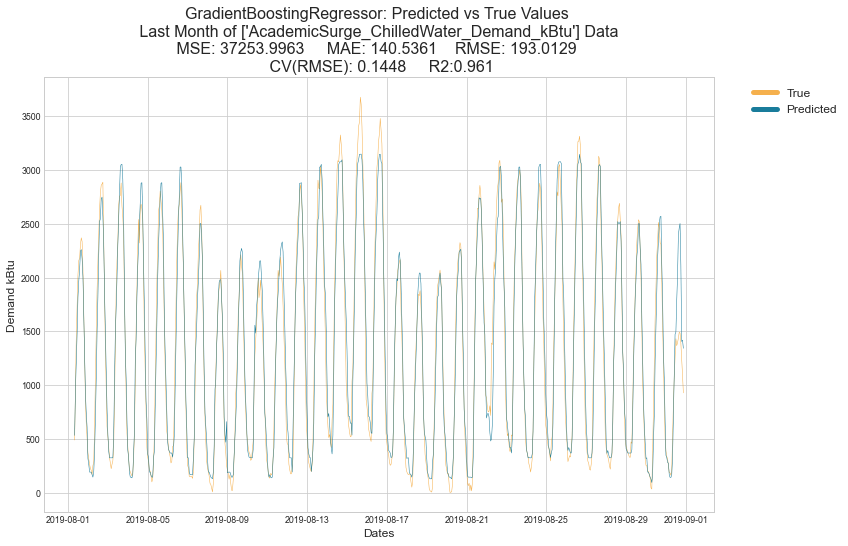

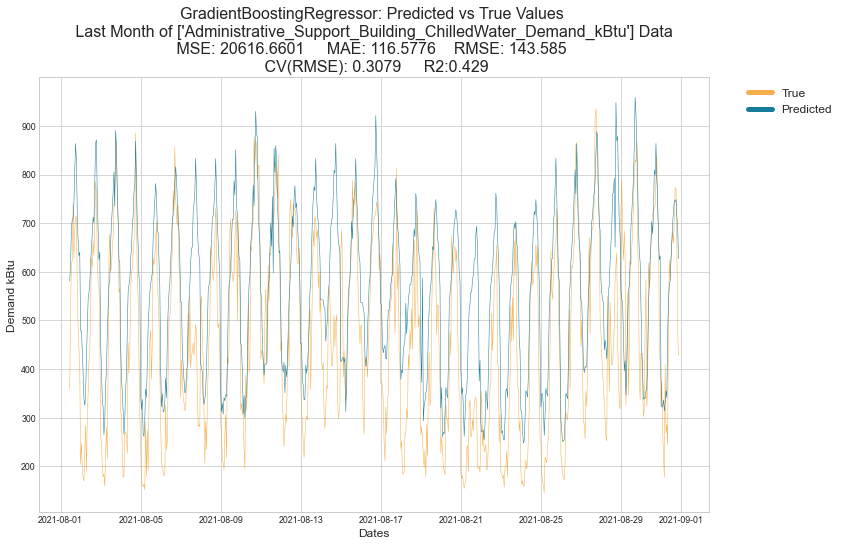

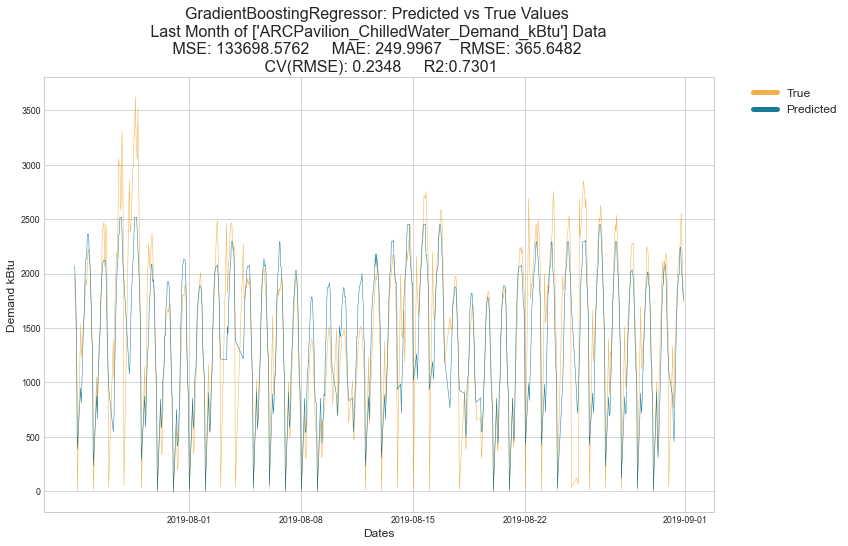

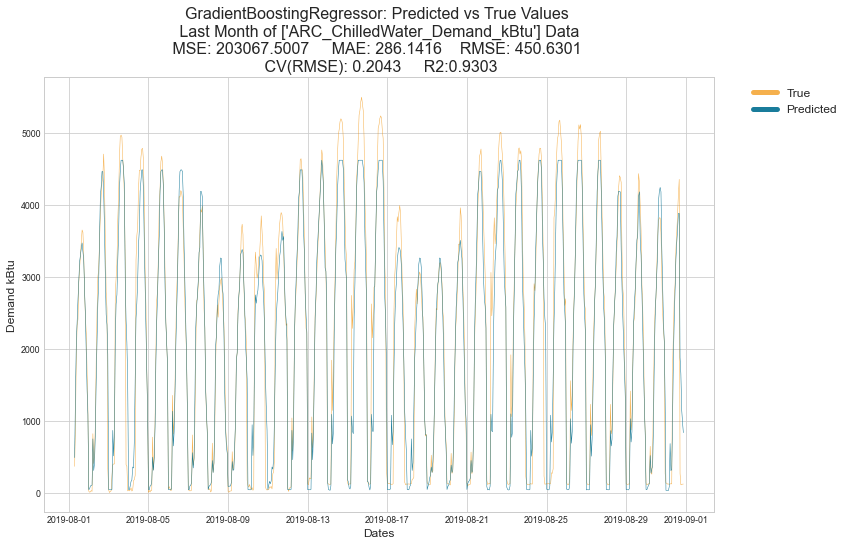

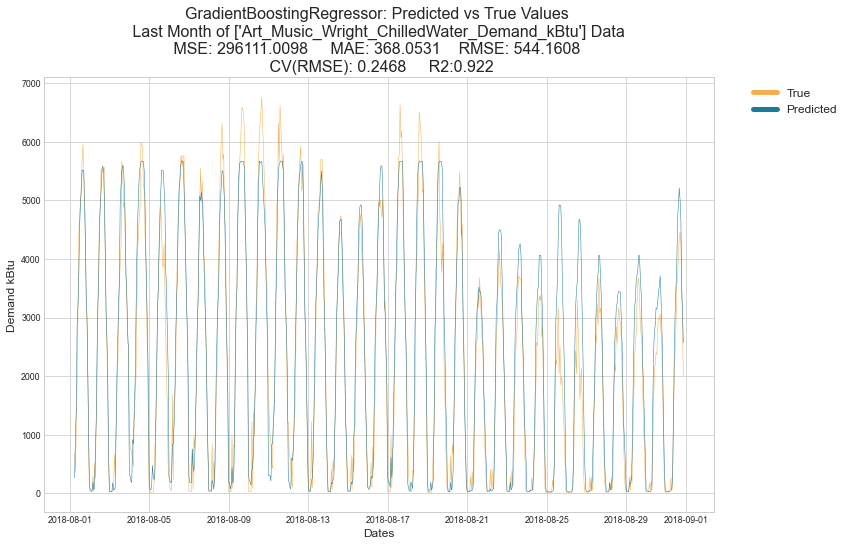

...

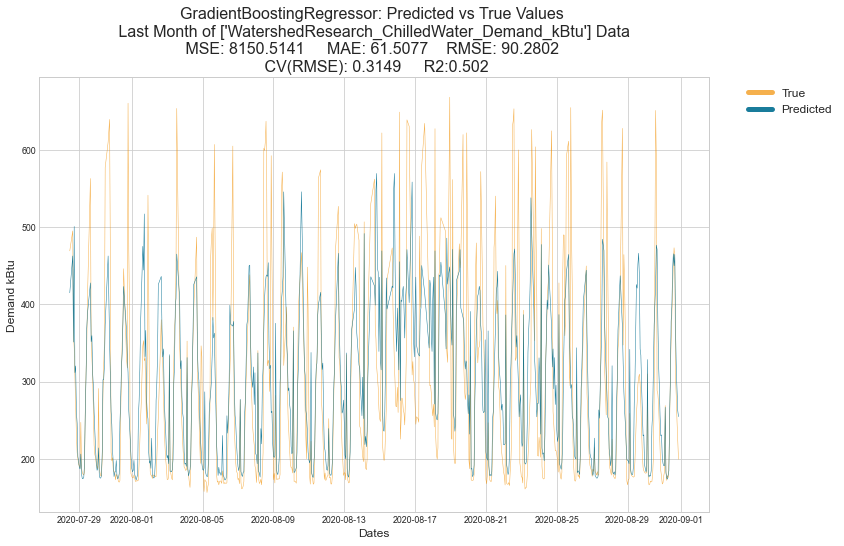

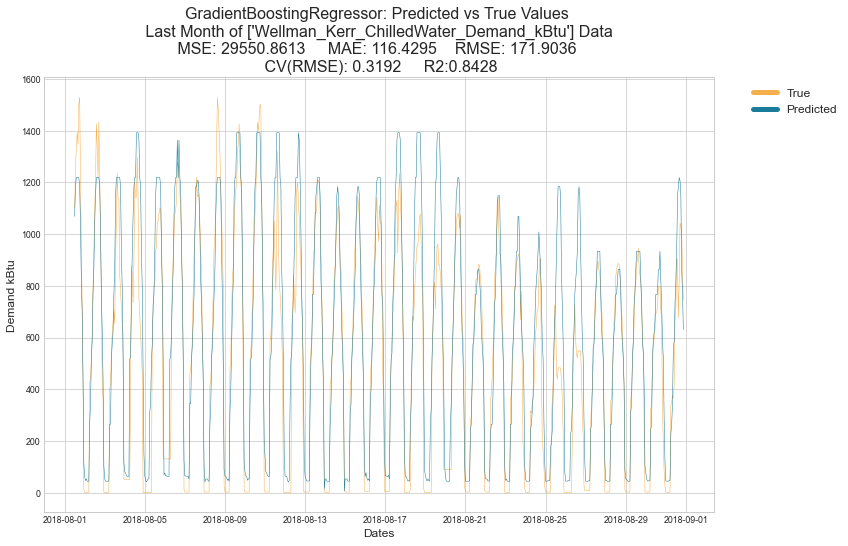

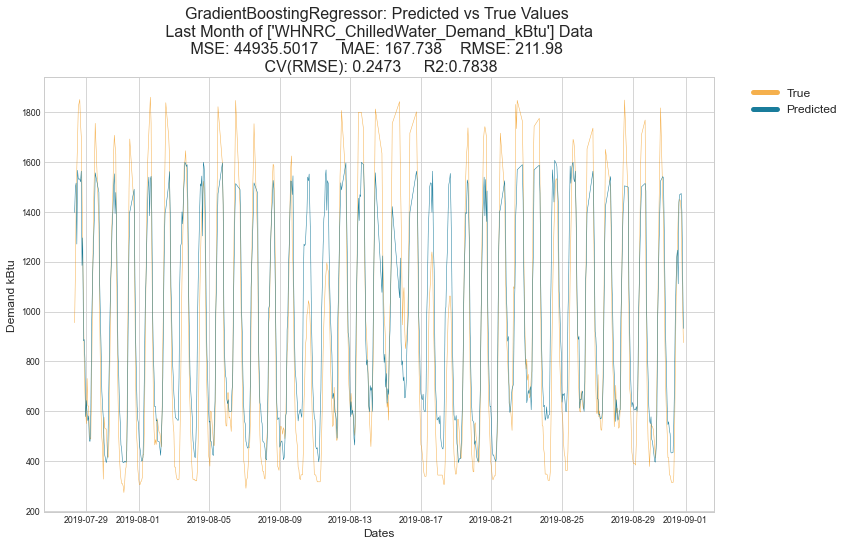

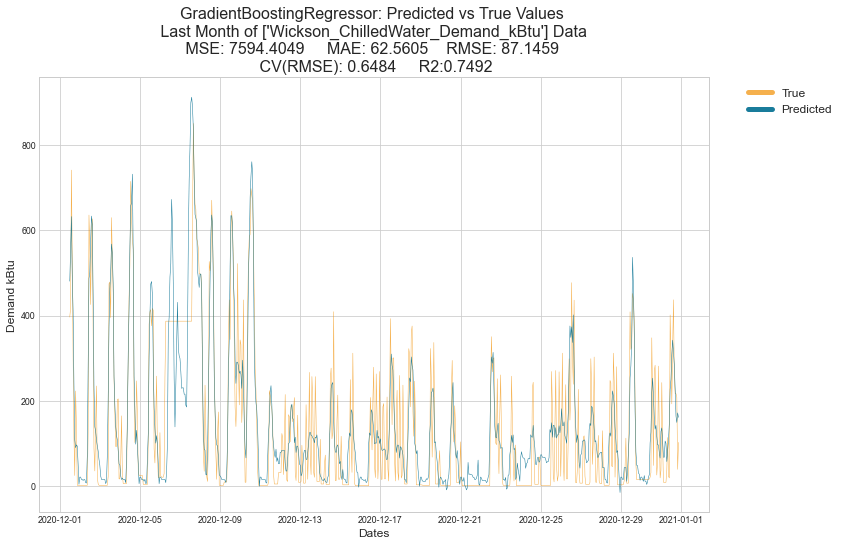

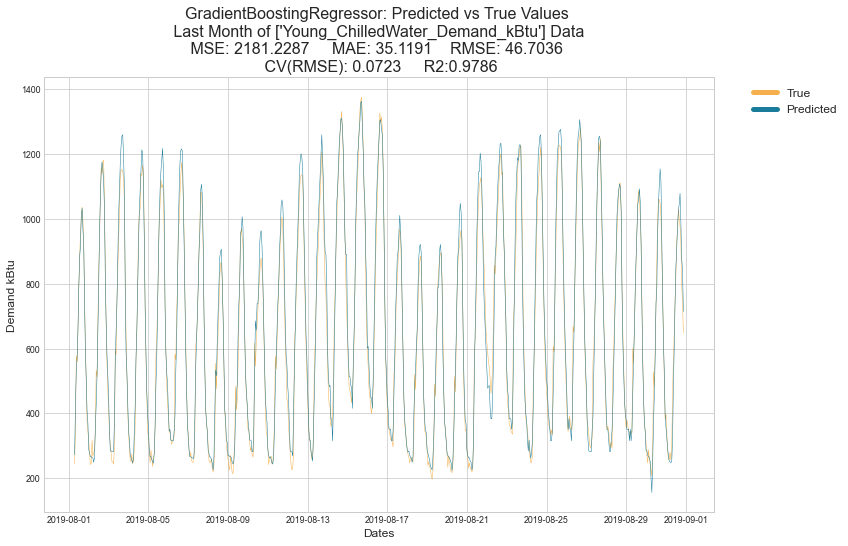

In [14]:
########################
chw_tags = pd.read_csv('chw_tags.csv')

#dataframe for predictions
predictions = pd.DataFrame()

#dataframe for dates
dates = pd.DataFrame()

#dataframe for results
results = pd.DataFrame()
results['Measure'] = list(['MSE', 'RMSE', 'MAE', 'CV(RMSE)', 'R-squared'])

tags = chw_tags['ChilledWater_Demand_kBtu'].tolist()

for i in tags:
    tag = list()
    tag.append(i)
    status = chw_tags.loc[chw_tags['ChilledWater_Demand_kBtu'] == i]['Status'].tolist()
    if (status[0] == 'complete'):
        predictions[i], results[i], dates[i] = demandkBtu_model(tag, test = True) 
    

In [138]:
#i

'Pitzer_Center_ChilledWater_Demand_kBtu'

In [93]:
#chw_tags.loc[chw_tags['ChilledWater_Demand_kBtu'] == 'Cole.B_ChilledWater_Demand_kBtu', 'start'] = '2020-09-01'
#chw_tags.loc[chw_tags['ChilledWater_Demand_kBtu'] == 'Cole.B_ChilledWater_Demand_kBtu', 'end'] = '2021-09-01'

In [142]:
#df = load_data(['Pitzer_Center_ChilledWater_Demand_kBtu'], start = '2020-09-01', end = '2021-09-01')
#df

00:38:47: Sending API request... Chunk 1 of 1
00:38:47: Response recieved for 1 tags! (0.84)


,Pitzer_Center_ChilledWater_Demand_kBtu
Timestamp,
2020-09-01 00:00:00,90.013753
2020-09-01 01:00:00,74.491534
2020-09-01 02:00:00,35.354017
2020-09-01 03:00:00,31.009054
2020-09-01 04:00:00,26.252136
...,...
2021-08-31 19:00:00,161.874069
2021-08-31 20:00:00,128.909151
2021-08-31 21:00:00,112.701238


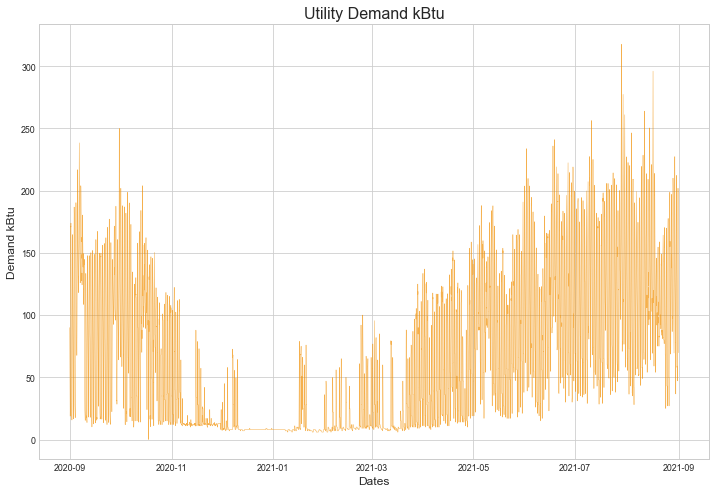

In [144]:
plot_demand(['Pitzer_Center_ChilledWater_Demand_kBtu'])

In [15]:
#pred_incomplete = predictions.copy()
#results_incomplete = results.copy()
#dates_incomplete = dates.copy()
predictions.to_csv('predictions_chw.csv', index = False)
results.to_csv('results_chw.csv', index = False)
dates.to_csv('dates_chw.csv', index = False)


In [28]:
#pred_complete = pd.read_csv('pred_complete.csv')
#results_complete = pd.read_csv('results_complete.csv')
#dates_complete = pd.read_csv('dates_complete.csv')


In [16]:
results = pd.read_csv('results_chw.csv')
results

,Measure,AcademicSurge_ChilledWater_Demand_kBtu,Administrative_Support_Building_ChilledWater_Demand_kBtu,ARCPavilion_ChilledWater_Demand_kBtu,ARC_ChilledWater_Demand_kBtu,Art_Music_Wright_ChilledWater_Demand_kBtu,Asmundson_ChilledWater_Demand_kBtu,Bainer_ChilledWater_Demand_kBtu,Briggs_ChilledWater_Demand_kBtu,California_ChilledWater_Demand_kBtu,...,VM3A_ChilledWater_Demand_kBtu,VM3B_ChilledWater_Demand_kBtu,VMIF_ChilledWater_Demand_kBtu,VMSSAC_ChilledWater_Demand_kBtu,VMTH_ChilledWater_Demand_kBtu,WatershedResearch_ChilledWater_Demand_kBtu,Wellman_Kerr_ChilledWater_Demand_kBtu,WHNRC_ChilledWater_Demand_kBtu,Wickson_ChilledWater_Demand_kBtu,Young_ChilledWater_Demand_kBtu
0,MSE,37253.996324,20616.660101,133698.576194,203067.500665,296111.009793,4730.635754,27662.272028,32726.265977,10117.090746,...,150141.090465,96697.137405,4955.353886,1598.654237,25775.986723,8150.514082,29550.861287,44935.501745,7594.404948,2181.228713
1,RMSE,193.012943,143.585027,365.648159,450.630115,544.160831,68.779617,166.319788,180.904024,100.583750,...,387.480439,310.961633,70.394275,39.983174,160.549017,90.280198,171.903640,211.979956,87.145883,46.703626
2,MAE,140.536065,116.577571,249.996677,286.141616,368.053080,46.877029,129.392642,125.516443,63.816746,...,274.657522,249.578327,41.746077,26.860932,118.079949,61.507703,116.429533,167.738038,62.560522,35.119059
3,CV(RMSE),0.144830,0.307907,0.234826,0.204276,0.246818,0.133687,0.126971,0.065927,1.158818,...,0.120332,0.167734,0.563384,0.296790,0.090600,0.314860,0.319182,0.247301,0.648435,0.072256
4,R-squared,0.960958,0.429010,0.730147,0.930297,0.921975,0.958706,0.945375,0.993530,0.227411,...,0.974111,0.869464,0.598984,0.399314,0.981191,0.501963,0.842817,0.783805,0.749212,0.978594


In [17]:
results.set_index('Measure', inplace = True)
results = results.transpose()
results.reset_index(inplace = True)
results


Measure,index,MSE,RMSE,MAE,CV(RMSE),R-squared
0,AcademicSurge_ChilledWater_Demand_kBtu,37253.996324,193.012943,140.536065,0.144830,0.960958
1,Administrative_Support_Building_ChilledWater_D...,20616.660101,143.585027,116.577571,0.307907,0.429010
2,ARCPavilion_ChilledWater_Demand_kBtu,133698.576194,365.648159,249.996677,0.234826,0.730147
3,ARC_ChilledWater_Demand_kBtu,203067.500665,450.630115,286.141616,0.204276,0.930297
4,Art_Music_Wright_ChilledWater_Demand_kBtu,296111.009793,544.160831,368.053080,0.246818,0.921975
...,...,...,...,...,...,...
76,WatershedResearch_ChilledWater_Demand_kBtu,8150.514082,90.280198,61.507703,0.314860,0.501963
77,Wellman_Kerr_ChilledWater_Demand_kBtu,29550.861287,171.903640,116.429533,0.319182,0.842817
78,WHNRC_ChilledWater_Demand_kBtu,44935.501745,211.979956,167.738038,0.247301,0.783805
79,Wickson_ChilledWater_Demand_kBtu,7594.404948,87.145883,62.560522,0.648435,0.749212


In [25]:
check = results.loc[(results['CV(RMSE)'] > 0.35) | (results['R-squared'] < 0.75)]
tags_chw = check['index'].tolist()
check

Measure,index,MSE,RMSE,MAE,CV(RMSE),R-squared
1,Administrative_Support_Building_ChilledWater_D...,2.061666e+04,143.585027,116.577571,0.307907,0.429010
2,ARCPavilion_ChilledWater_Demand_kBtu,1.336986e+05,365.648159,249.996677,0.234826,0.730147
8,California_ChilledWater_Demand_kBtu,1.011709e+04,100.583750,63.816746,1.158818,0.227411
9,CampusDataCenter_ChilledWater_Demand_kBtu,5.812126e+01,7.623730,5.355321,0.041304,-0.865338
11,Central_Cage_Wash_ChilledWater_Demand_kBtu,1.905127e+04,138.026337,93.262184,0.609761,0.577678
12,CFA_Admin_ChilledWater_Demand_kBtu,2.049887e+02,14.317426,5.758450,1.688257,0.405740
13,CFA_Mondavi_ChilledWater_Demand_kBtu,4.223439e+04,205.510064,169.999779,0.437027,0.581280
18,Dutton_ChilledWater_Demand_kBtu,1.278891e+04,113.088074,66.035893,0.294140,0.741925
21,Freeborn_ChilledWater_Demand_kBtu,3.680904e+03,60.670455,50.541930,0.344813,0.414528
24,Giedt_ChilledWater_Demand_kBtu,3.288297e+03,57.343675,33.511756,0.473956,0.724316


In [21]:
summary_chw_c = pd.DataFrame()
summary_chw_c['Tag'] = check['index']
summary_chw_c['CV(RMSE)'] = check['CV(RMSE)']
summary_chw_c['R-squared'] = check['R-squared']
summary_chw_c.reset_index(inplace = True, drop = True)

summary_chw_c.to_csv('summary_chw_c.csv', index = False)

In [23]:
summary_chw = pd.DataFrame()
summary_chw['Tag'] = check['index']
summary_chw['CV(RMSE)'] = check['CV(RMSE)']
summary_chw['R-squared'] = check['R-squared']
summary_chw.reset_index(inplace = True, drop = True)

summary_chw.to_csv('summary_chw.csv', index = False)

In [24]:
summary_chw

,Tag,CV(RMSE),R-squared
0,AcademicSurge_ChilledWater_Demand_kBtu,0.144830,0.960958
1,ARC_ChilledWater_Demand_kBtu,0.204276,0.930297
2,Art_Music_Wright_ChilledWater_Demand_kBtu,0.246818,0.921975
3,Asmundson_ChilledWater_Demand_kBtu,0.133687,0.958706
4,Bainer_ChilledWater_Demand_kBtu,0.126971,0.945375
5,Briggs_ChilledWater_Demand_kBtu,0.065927,0.993530
6,CCAH_ChilledWater_Demand_kBtu,0.112576,0.897252
7,Chemistry.Annex_ChilledWater_Demand_kBtu,0.086392,0.978479
8,Chemistry_ChilledWater_Demand_kBtu,0.094633,0.961465
9,Cole.B_ChilledWater_Demand_kBtu,0.184297,0.958926


In [20]:
summary_chw_c

,Tag,CV(RMSE),R-squared
0,Administrative_Support_Building_ChilledWater_D...,0.307907,0.429010
1,ARCPavilion_ChilledWater_Demand_kBtu,0.234826,0.730147
2,California_ChilledWater_Demand_kBtu,1.158818,0.227411
3,CampusDataCenter_ChilledWater_Demand_kBtu,0.041304,-0.865338
4,Central_Cage_Wash_ChilledWater_Demand_kBtu,0.609761,0.577678
5,CFA_Admin_ChilledWater_Demand_kBtu,1.688257,0.405740
6,CFA_Mondavi_ChilledWater_Demand_kBtu,0.437027,0.581280
7,Dutton_ChilledWater_Demand_kBtu,0.294140,0.741925
8,Freeborn_ChilledWater_Demand_kBtu,0.344813,0.414528
9,Giedt_ChilledWater_Demand_kBtu,0.473956,0.724316


In [140]:
chw_tags.loc[chw_tags['ChilledWater_Demand_kBtu'] == 'Pitzer_Center_ChilledWater_Demand_kBtu']

,ChilledWater_Demand_kBtu,start,end,Status
48,Pitzer_Center_ChilledWater_Demand_kBtu,2020-09-01,2021-09-01,complete


In [106]:
tags_chw = ['Kemper_ChilledWater_Demand_kBtu', 'WatershedResearch_ChilledWater_Demand_kBtu']

In [23]:
len(tags_chw)

35

18:00:02: Sending API request... Chunk 1 of 1
18:00:03: Response recieved for 1 tags! (0.61)
18:00:03: Sending API request... Chunk 1 of 1
18:00:04: Response recieved for 1 tags! (0.73)
18:00:04: Sending API request... Chunk 1 of 1
18:00:04: Response recieved for 1 tags! (0.54)
18:00:04: Sending API request... Chunk 1 of 1
18:00:05: Response recieved for 1 tags! (0.53)
18:00:05: Sending API request... Chunk 1 of 1
18:00:06: Response recieved for 1 tags! (0.63)
18:00:06: Sending API request... Chunk 1 of 1
18:00:06: Response recieved for 1 tags! (0.46)
18:00:06: Sending API request... Chunk 1 of 1
18:00:07: Response recieved for 1 tags! (0.67)
18:00:07: Sending API request... Chunk 1 of 1
18:00:08: Response recieved for 1 tags! (0.71)
18:00:08: Sending API request... Chunk 1 of 1
18:00:08: Response recieved for 1 tags! (0.52)
18:00:08: Sending API request... Chunk 1 of 1
18:00:09: Response recieved for 1 tags! (0.53)
18:00:09: Sending API request... Chunk 1 of 1
18:00:09: Response recie

<ipython-input-2-f7df8bd2c3a7>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (12,8))


18:00:22: Response recieved for 1 tags! (0.58)
18:00:22: Sending API request... Chunk 1 of 1
18:00:22: Response recieved for 1 tags! (0.5)
18:00:22: Sending API request... Chunk 1 of 1
18:00:23: Response recieved for 1 tags! (0.79)
18:00:23: Sending API request... Chunk 1 of 1
18:00:24: Response recieved for 1 tags! (0.51)
18:00:24: Sending API request... Chunk 1 of 1
18:00:24: Response recieved for 1 tags! (0.62)
18:00:25: Sending API request... Chunk 1 of 1
18:00:25: Response recieved for 1 tags! (0.48)
18:00:25: Sending API request... Chunk 1 of 1
18:00:26: Response recieved for 1 tags! (0.63)
18:00:26: Sending API request... Chunk 1 of 1
18:00:26: Response recieved for 1 tags! (0.49)
18:00:26: Sending API request... Chunk 1 of 1
18:00:27: Response recieved for 1 tags! (0.57)
18:00:27: Sending API request... Chunk 1 of 1
18:00:28: Response recieved for 1 tags! (0.67)
18:00:28: Sending API request... Chunk 1 of 1
18:00:28: Response recieved for 1 tags! (0.44)
18:00:28: Sending API re

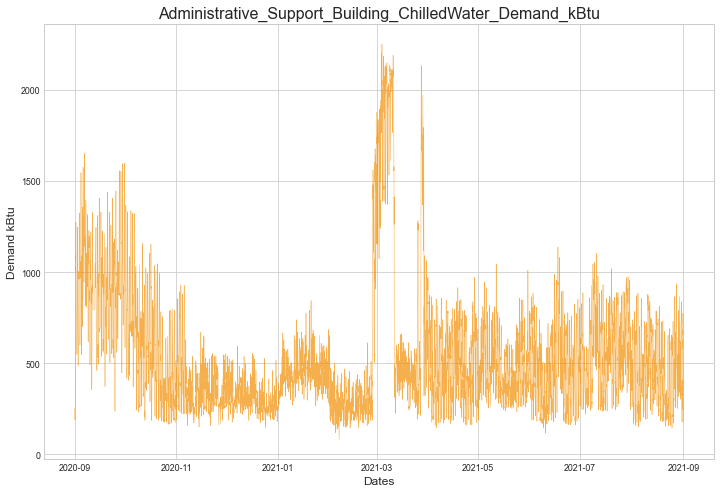

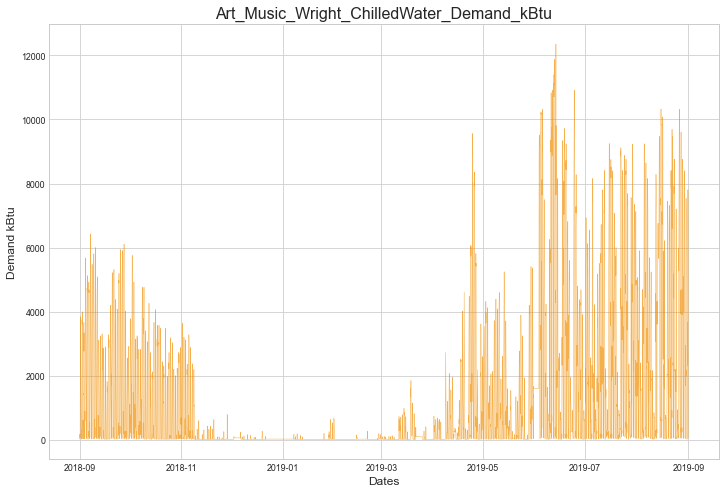

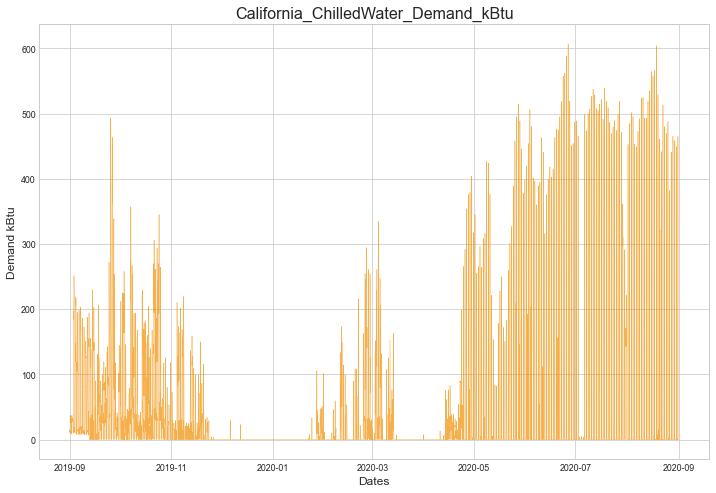

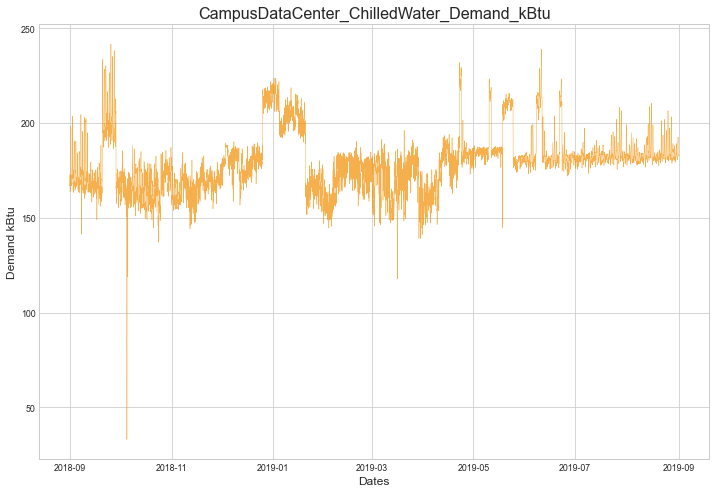

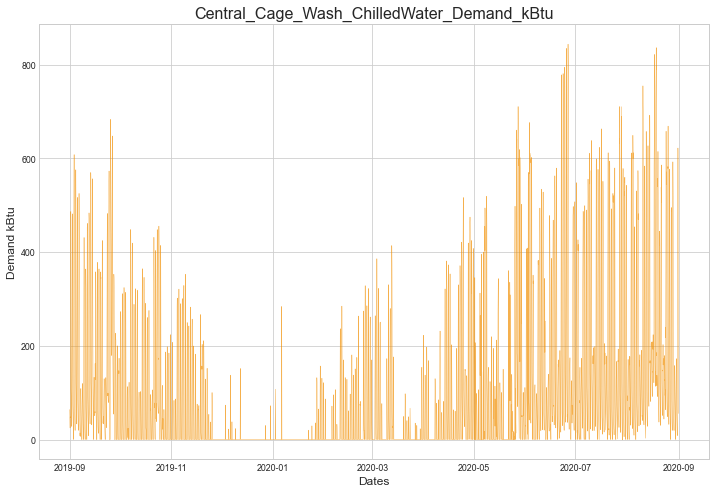

...

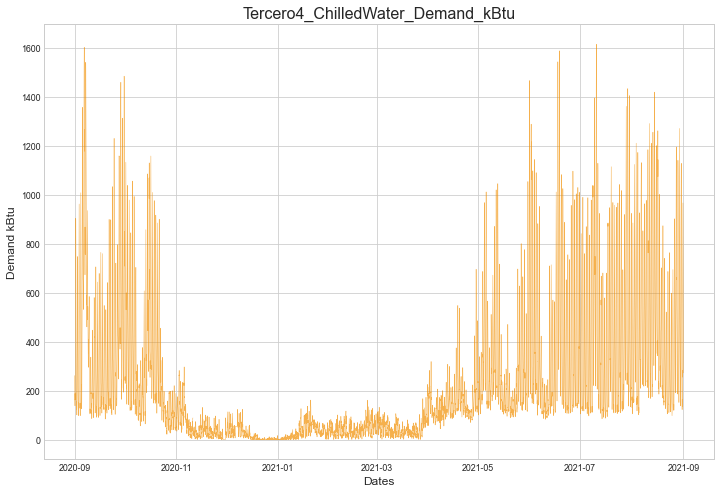

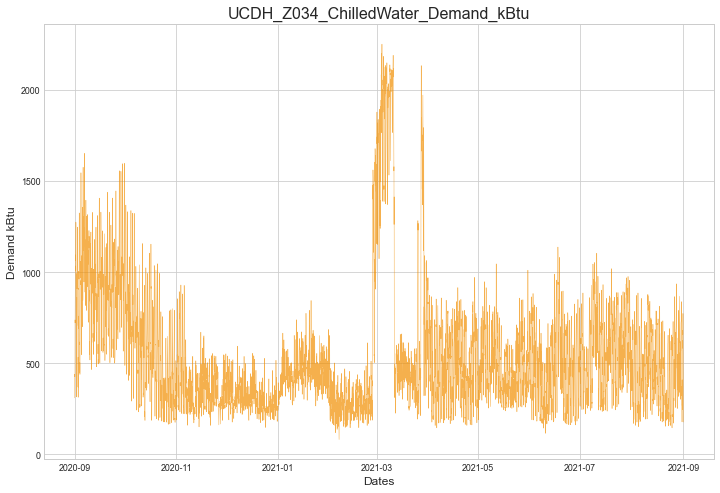

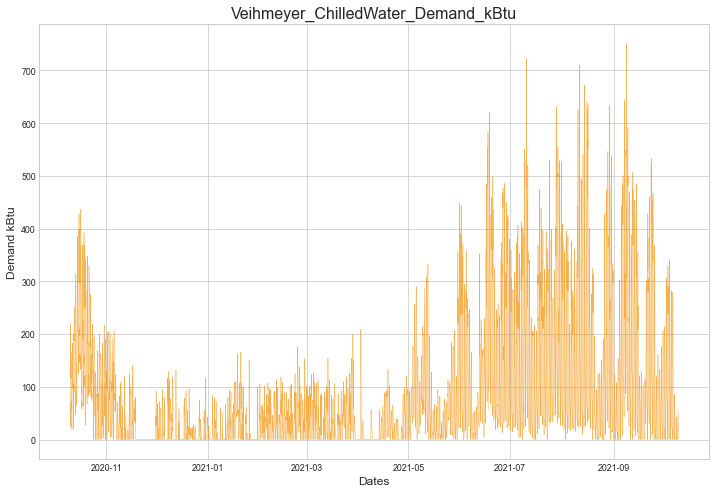

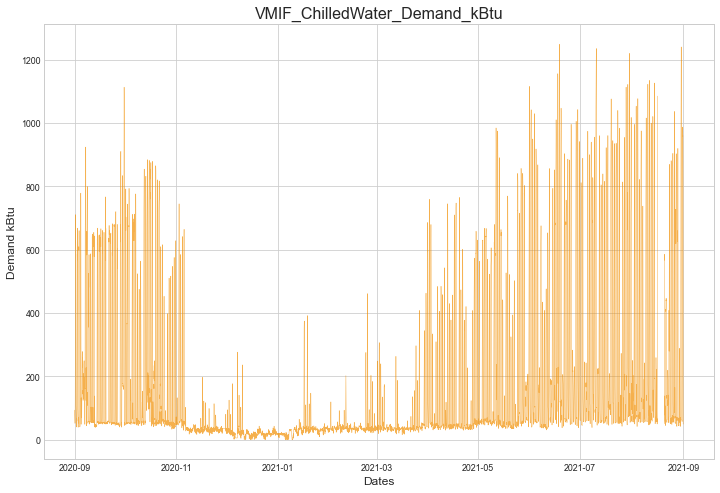

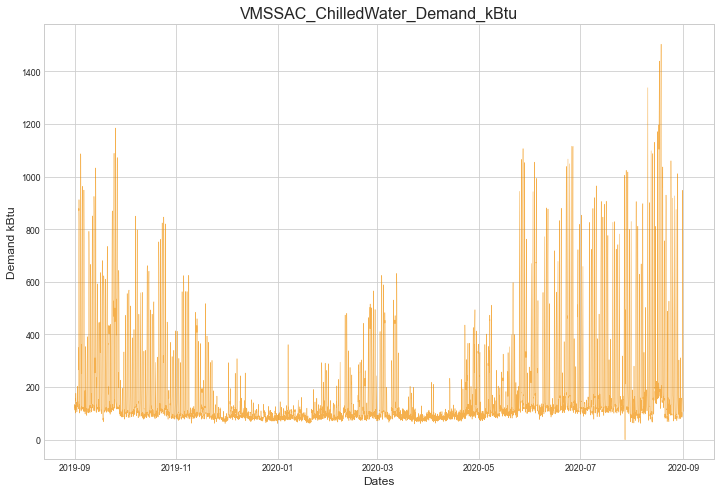

In [24]:
for i in tags_chw:
    df = load_data([i])
    plot_demand([i], title = i)
    

18:08:44: Sending API request... Chunk 1 of 1
18:08:47: Response recieved for 1 tags! (3.28)
18:08:48: Sending API request... Chunk 1 of 1
18:08:51: Response recieved for 1 tags! (3.38)
18:08:51: Sending API request... Chunk 1 of 1
18:08:55: Response recieved for 1 tags! (3.37)
18:08:55: Sending API request... Chunk 1 of 1
18:09:02: Response recieved for 1 tags! (6.85)
18:09:02: Sending API request... Chunk 1 of 1
18:09:06: Response recieved for 1 tags! (4.31)
18:09:07: Sending API request... Chunk 1 of 1
18:09:10: Response recieved for 1 tags! (3.31)
18:09:10: Sending API request... Chunk 1 of 1
18:09:16: Response recieved for 1 tags! (5.5)
18:09:16: Sending API request... Chunk 1 of 1
18:09:19: Response recieved for 1 tags! (2.92)
18:09:19: Sending API request... Chunk 1 of 1
18:09:21: Response recieved for 1 tags! (1.9)
18:09:21: Sending API request... Chunk 1 of 1
18:09:23: Response recieved for 1 tags! (1.62)
18:09:23: Sending API request... Chunk 1 of 1
18:09:25: Response recieve

<ipython-input-2-f7df8bd2c3a7>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (12,8))


18:10:05: Sending API request... Chunk 1 of 1
18:10:08: Response recieved for 1 tags! (3.75)
18:10:09: Sending API request... Chunk 1 of 1
18:10:11: Response recieved for 1 tags! (2.2)
18:10:11: Sending API request... Chunk 1 of 1
18:10:18: Response recieved for 1 tags! (6.88)
18:10:18: Sending API request... Chunk 1 of 1
18:10:21: Response recieved for 1 tags! (2.87)
18:10:21: Sending API request... Chunk 1 of 1
18:10:26: Response recieved for 1 tags! (5.02)
18:10:27: Sending API request... Chunk 1 of 1
18:10:29: Response recieved for 1 tags! (2.01)
18:10:29: Sending API request... Chunk 1 of 1
18:10:31: Response recieved for 1 tags! (2.55)
18:10:32: Sending API request... Chunk 1 of 1
18:10:34: Response recieved for 1 tags! (2.18)
18:10:34: Sending API request... Chunk 1 of 1
18:10:37: Response recieved for 1 tags! (2.74)
18:10:37: Sending API request... Chunk 1 of 1
18:10:46: Response recieved for 1 tags! (8.47)
18:10:46: Sending API request... Chunk 1 of 1
18:10:49: Response reciev

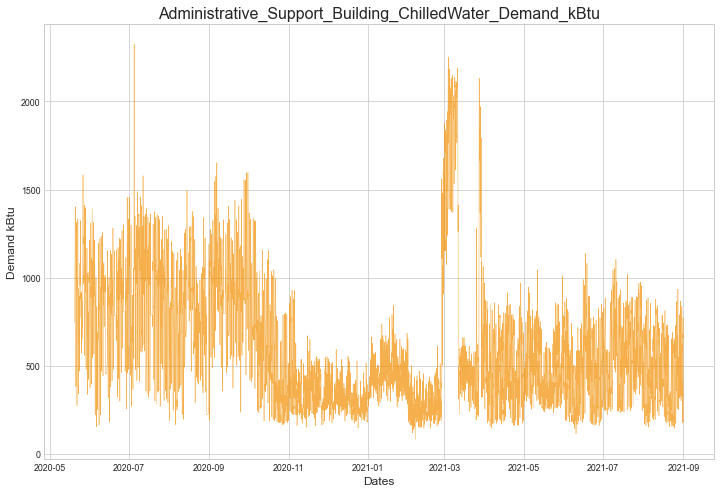

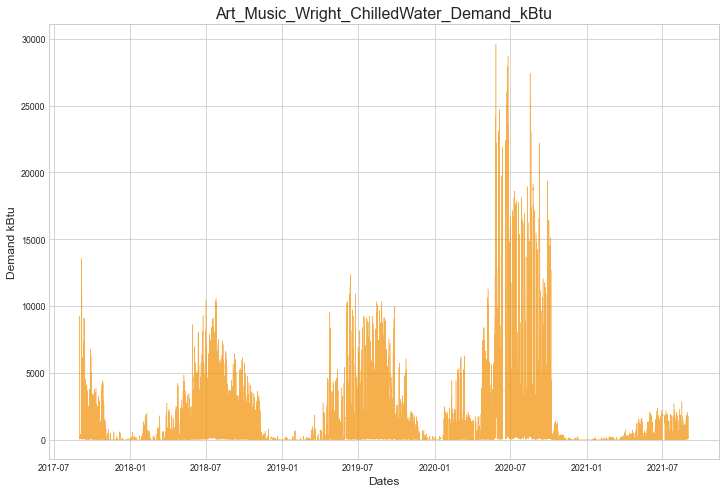

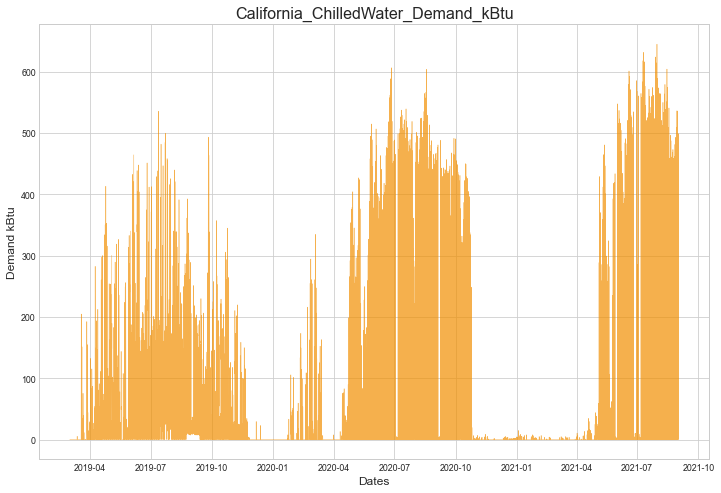

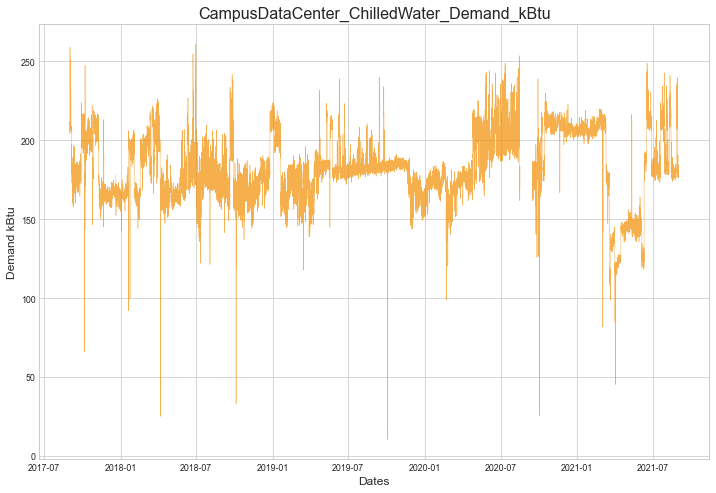

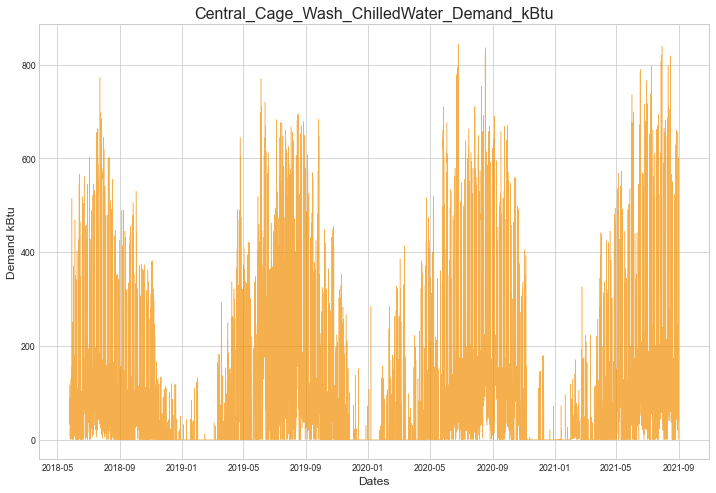

...

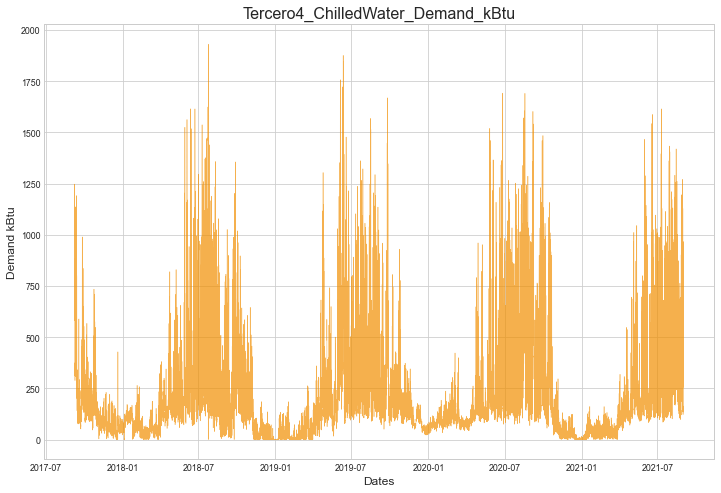

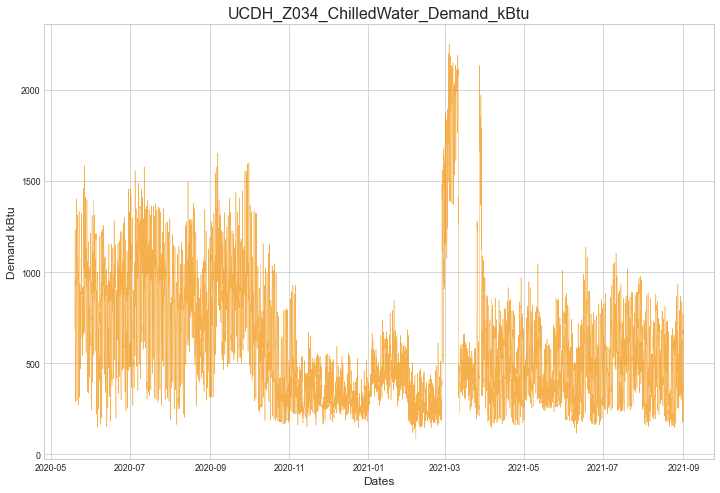

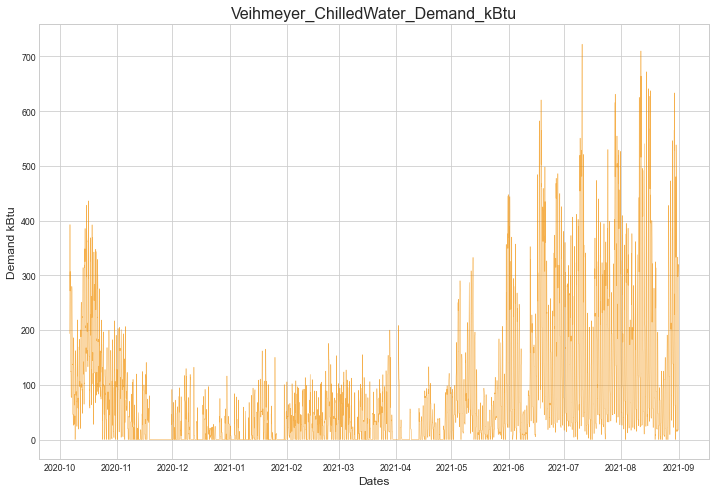

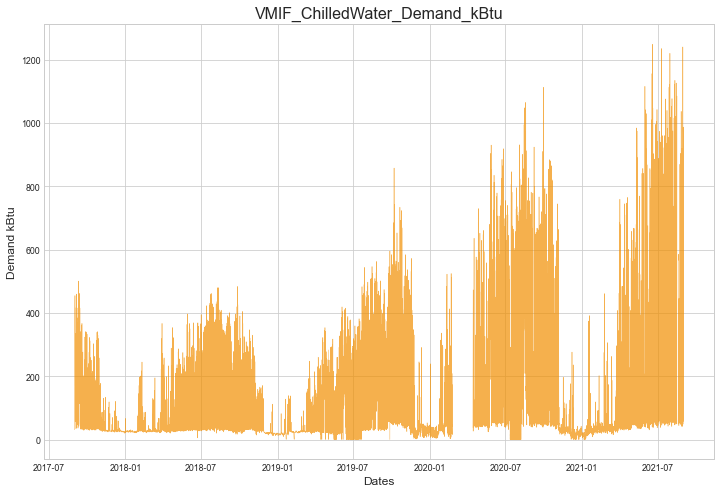

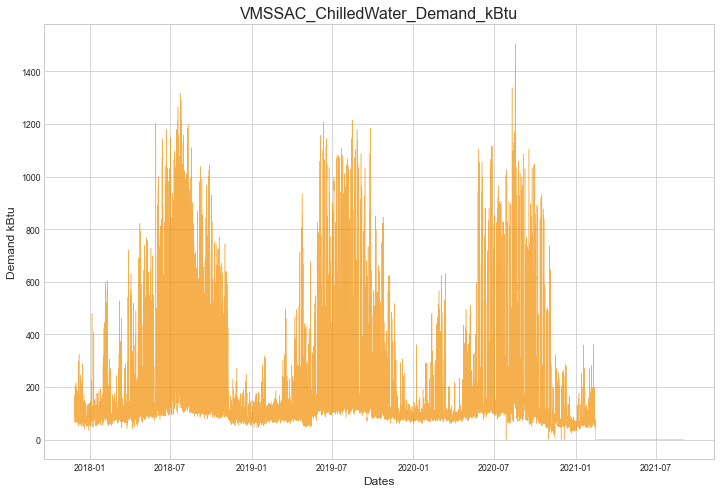

In [26]:
for i in tags_chw:
    df = load_data([i], start = '2017-09-01', end = '2021-09-01')
    plot_demand([i], title = i)
    

In [ ]:
# make list of changes to make
# bad data and bad model
['Administrative_Support_Building_ChilledWater_Demand_kBtu', 'California_ChilledWater_Demand_kBtu', 'CampusDataCenter_ChilledWater_Demand_kBtu',
'Central_Cage_Wash_ChilledWater_Demand_kBtu', 'Freeborn_ChilledWater_Demand_kBtu', 'Dutton_ChilledWater_Demand_kBtu', 'Hoagland_ChilledWater_Demand_kBtu',
'Latitude_DC_ChilledWater_Demand_kBtu', 'Mrak_ChilledWater_Demand_kBtu', 'Olson_ChilledWater_Demand_kBtu', 'Physics.Roessler_ChilledWater_Demand_kBtu', 
'Scrubs_Cafe_ChilledWater_Demand_kBtu', 'SegundoServices_ChilledWater_Demand_kBtu', 'Shields_ChilledWater_Demand_kBtu',
'Social_Science_ChilledWater_Demand_kBtu', 'SoE_ChilledWater_Demand_kBtu', 'Sproul_ChilledWater_Demand_kBtu', 'Tercero4_ChilledWater_Demand_kBtu', 
'UCDH_Z034_ChilledWater_Demand_kBtu', 'Veihmeyer_ChilledWater_Demand_kBtu', 'VMIF_ChilledWater_Demand_kBtu', 'CFA_Admin_ChilledWater_Demand_kBtu', 
'CFA_Mondavi_ChilledWater_Demand_kBtu', 'Giedt_ChilledWater_Demand_kBtu', 'HealthWellness_ChilledWater_Demand_kBtu', 'HousingAdmin_ChilledWater_Demand_kBtu',
'MathSci_ChilledWater_Demand_kBtu', 'SCC_ChilledWater_Demand_kBtu', 'VMSSAC_ChilledWater_Demand_kBtu']

# year change
# if these dont improve move to bad model list
'Art_Music_Wright_ChilledWater_Demand_kBtu', '2017-09-01' works
'CFA_Admin_ChilledWater_Demand_kBtu', '2018-09-01' nope
'CFA_Mondavi_ChilledWater_Demand_kBtu', '2018-12-01' nope
'Chemistry_ChilledWater_Demand_kBtu', '2018-09-01' works
'Giedt_ChilledWater_Demand_kBtu', '2017-09-01' nope
'Gourley_ChilledWater_Demand_kBtu', '2018-09-01' works
'HealthWellness_ChilledWater_Demand_kBtu', '2017-09-01' nope
'HousingAdmin_ChilledWater_Demand_kBtu', '2019-08-01' nope
'MathSci_ChilledWater_Demand_kBtu', '2020-09-01' nope
'PES_ChilledWater_Demand_kBtu', '2018-09-01' works
'Pitzer_Center_ChilledWater_Demand_kBtu', '2020-09-01' works
'SCC_ChilledWater_Demand_kBtu', '2017-09-01' nope
'Shrem_Museum_ChilledWater_Demand_kBtu', '2018-09-01' works
'VMSSAC_ChilledWater_Demand_kBtu', '2019-09-01' nope


# borderline and just keep track
'Dutton_ChilledWater_Demand_kBtu',
'PES_ChilledWater_Demand_kBtu',
'SegundoServices_ChilledWater_Demand_kBtu',
'Veihmeyer_ChilledWater_Demand_kBtu',

#####



In [46]:
tags_change_year = ['Art_Music_Wright_ChilledWater_Demand_kBtu',
                    'CFA_Admin_ChilledWater_Demand_kBtu',
                    'CFA_Mondavi_ChilledWater_Demand_kBtu', 
                    'Chemistry_ChilledWater_Demand_kBtu', 
                    'Giedt_ChilledWater_Demand_kBtu',
                    'Gourley_ChilledWater_Demand_kBtu', 
                    'HealthWellness_ChilledWater_Demand_kBtu', 
                    'HousingAdmin_ChilledWater_Demand_kBtu',  
                    'MathSci_ChilledWater_Demand_kBtu', 
                    'PES_ChilledWater_Demand_kBtu',  
                    'Pitzer_Center_ChilledWater_Demand_kBtu', 
                    'SCC_ChilledWater_Demand_kBtu',  
                    'Shrem_Museum_ChilledWater_Demand_kBtu', 
                    'VMSSAC_ChilledWater_Demand_kBtu'] 

start_change = ['2017-09-01', '2018-09-01', '2018-12-01', '2018-09-01', '2017-09-01', '2018-09-01', '2017-09-01' , 
               '2019-08-01', '2020-09-01', '2018-09-01', '2020-09-01', '2017-09-01',  '2018-09-01', '2019-09-01']

end_change = ['2018-09-01', '2019-09-01', '2019-12-01', '2019-09-01', '2018-09-01', '2019-09-01', '2018-09-01' , 
               '2020-08-01', '2021-09-01', '2019-09-01', '2021-09-01', '2018-09-01',  '2019-09-01', '2020-09-01']

tags_change_status = ['Administrative_Support_Building_ChilledWater_Demand_kBtu', 'California_ChilledWater_Demand_kBtu', 'CampusDataCenter_ChilledWater_Demand_kBtu',
                    'Central_Cage_Wash_ChilledWater_Demand_kBtu', 'Freeborn_ChilledWater_Demand_kBtu', 'Dutton_ChilledWater_Demand_kBtu', 'Hoagland_ChilledWater_Demand_kBtu',
                    'Latitude_DC_ChilledWater_Demand_kBtu', 'Mrak_ChilledWater_Demand_kBtu', 'Olson_ChilledWater_Demand_kBtu', 'Physics.Roessler_ChilledWater_Demand_kBtu', 
                    'Scrubs_Cafe_ChilledWater_Demand_kBtu', 'SegundoServices_ChilledWater_Demand_kBtu', 'Shields_ChilledWater_Demand_kBtu',
                    'Social_Science_ChilledWater_Demand_kBtu', 'SoE_ChilledWater_Demand_kBtu', 'Sproul_ChilledWater_Demand_kBtu', 'Tercero4_ChilledWater_Demand_kBtu', 
                    'UCDH_Z034_ChilledWater_Demand_kBtu', 'Veihmeyer_ChilledWater_Demand_kBtu', 'VMIF_ChilledWater_Demand_kBtu', 'CFA_Admin_ChilledWater_Demand_kBtu', 
                    'CFA_Mondavi_ChilledWater_Demand_kBtu', 'Giedt_ChilledWater_Demand_kBtu', 'HealthWellness_ChilledWater_Demand_kBtu', 'HousingAdmin_ChilledWater_Demand_kBtu',
                    'MathSci_ChilledWater_Demand_kBtu', 'SCC_ChilledWater_Demand_kBtu', 'VMSSAC_ChilledWater_Demand_kBtu']


00:39:54: Sending API request... Chunk 1 of 1
00:39:55: Response recieved for 1 tags! (0.66)
00:39:55: Sending API request... Chunk 1 of 1
00:39:56: Response recieved for 1 tags! (0.59)
00:39:56: Sending API request... Chunk 1 of 1
00:39:56: Response recieved for 1 tags! (0.44)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


(array([133.79302843, 157.56794604, 164.61414825, 175.69814679,
        188.32835407, 193.00245402, 196.85431914, 194.49022121,
        175.70292433, 148.42377912, 132.61463398, 124.810181  ,
        115.78549261,  90.25222878,  89.02469676,  77.6565308 ,
         67.7301733 ,  56.09381397,  56.16134384,  46.64189948,
         46.30719737,  73.62415595,  96.14212062, 105.45917073,
        129.05718269, 154.37419478, 157.99693049, 172.4809025 ,
        183.07179151, 190.94818794, 194.80005306, 194.49022121,
        176.14507225, 159.75467319, 138.68174326, 124.810181  ,
        113.9711677 ,  89.38350215,  70.52974556,  65.02353738,
         59.11859982,  57.67050518,  53.79050132,  37.90019726,
         39.63619844,  57.10774639,  91.26604107, 114.15147714,
        132.77942005, 158.48944579, 172.14648529, 185.52602073,
        194.7137903 , 198.01161411, 201.86347923, 197.9926603 ,
        188.6262907 , 162.11538485, 143.94752929, 128.02572529,
        116.9258872 ,  89.38350215,  68.

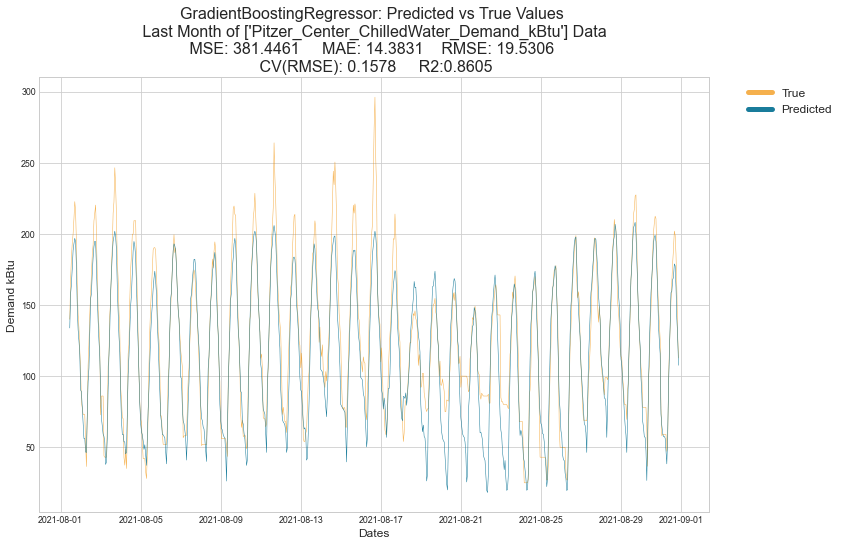

In [145]:
# run modified models to see if there is any change
demandkBtu_model(['Pitzer_Center_ChilledWater_Demand_kBtu'], start = '2020-09-01', end = '2021-09-01', test = True)



In [9]:
chw_tags = pd.read_csv('chw_tags.csv')
chw_tags

,ChilledWater_Demand_kBtu,start,end,Status
0,AcademicSurge_ChilledWater_Demand_kBtu,2018-09-01,2019-09-01,complete
1,Administrative_Support_Building_ChilledWater_D...,2020-09-01,2021-09-01,bad model
2,ARCPavilion_ChilledWater_Demand_kBtu,2018-09-01,2019-09-01,complete
3,ARC_ChilledWater_Demand_kBtu,2018-09-01,2019-09-01,complete
4,ArtStudio_ChilledWater_Demand_kBtu,no data,no data,no data
...,...,...,...,...
87,WatershedResearch_ChilledWater_Demand_kBtu,2019-09-01,2020-09-01,bad model
88,Wellman_Kerr_ChilledWater_Demand_kBtu,2017-09-01,2018-09-01,complete
89,WHNRC_ChilledWater_Demand_kBtu,2018-09-01,2019-09-01,complete
90,Wickson_ChilledWater_Demand_kBtu,2020-01-01,2021-01-01,complete


In [61]:
# change dates as needed in appropiate file
#for i in range(len(tags_chw)):
#    chw_tags.loc[(chw_tags['ChilledWater_Demand_kBtu'] == tags_change_year[i]), 'start'] = start_change[i]
#    chw_tags.loc[(chw_tags['ChilledWater_Demand_kBtu'] == tags_change_year[i]), 'end'] = end_change[i]


In [62]:
chw_tags

,ChilledWater_Demand_kBtu,start,end,Status
0,AcademicSurge_ChilledWater_Demand_kBtu,2018-09-01,2019-09-01,complete
1,Administrative_Support_Building_ChilledWater_D...,2020-09-01,2021-09-01,complete
2,ARCPavilion_ChilledWater_Demand_kBtu,2018-09-01,2019-09-01,complete
3,ARC_ChilledWater_Demand_kBtu,2018-09-01,2019-09-01,complete
4,ArtStudio_ChilledWater_Demand_kBtu,no data,no data,no data
...,...,...,...,...
87,WatershedResearch_ChilledWater_Demand_kBtu,2020-09-01,2019-09-01,complete
88,Wellman_Kerr_ChilledWater_Demand_kBtu,2017-09-01,2018-09-01,complete
89,WHNRC_ChilledWater_Demand_kBtu,2018-09-01,2019-09-01,complete
90,Wickson_ChilledWater_Demand_kBtu,2020-01-01,2021-01-01,complete


In [135]:
#chw_tags.to_csv('chw_tags.csv', index = False)

In [10]:
chw_tags.loc[(chw_tags['Status'] == 'bad model'), 'Status'] = 'complete'


In [26]:
# change status
for i in range(len(tags_chw)):
    chw_tags.loc[(chw_tags['ChilledWater_Demand_kBtu'] == tags_chw[i]), 'Status'] = 'bad model'
    
    

In [27]:
chw_tags.to_csv('chw_tags.csv', index = False)


In [57]:
#tags_chw.to_csv('tags_chw_nogood.csv', index = False)
#pd.read_csv('tags_chw_nogood.csv')